# Загружаю датасет "Отток клиентов телекоммуникационной компании"

## Описание
Этот набор данных содержит 243 553 строки данных клиентов четырех крупных телекоммуникационных партнеров Индии: Airtel, Reliance Jio, Vodafone и BSNL. Набор данных включает различные демографические, географические и характеристики использования для каждого клиента, а также бинарную переменную, указывающую, покинул ли клиент компанию (отток) или нет.

## Переменные
* **customer_id:** Уникальный идентификатор каждого клиента.
* **telecom_partner:** Телекоммуникационный партнер, связанный с клиентом.
* **gender:** Пол клиента.
* **age:** Возраст клиента.
* **state:** Штат Индии, в котором находится клиент.
* **city:** Город, в котором находится клиент.
* **pincode:** Пин-код местоположения клиента.
* **date_of_registration:** Дата регистрации клиента у телекоммуникационного партнера.
* **num_dependents:** Количество иждивенцев (например, детей) у клиента.
* **estimated_salary:** Предполагаемая зарплата клиента.
* **calls_made:** Количество совершенных клиентом звонков.
* **sms_sent:** Количество отправленных клиентом SMS-сообщений.
* **data_used:** Объем данных, использованных клиентом.
* **churn:** Бинарная переменная, указывающая, покинул ли клиент компанию (отток) или нет (1 = отток, 0 = не отток).


# Введение

В итоговой работе по блоку "Математика" я планирую провести комплексный анализ данных. Целью данного исследования является применение полученных знаний и навыков в области регрессионного анализа, теории вероятностей и математической статистики для решения реальных задач анализа данных. А также грамотной визуализации. 

Сначала я проведу "Исследовательский анализ данных", посмотрю на различия и сходства в распределениях признаков между различными группами наблюдений. Сформулирую и протестирую статистические гипотезы о различиях между сегментами данных. А также предложу продуктовые гипотезы и идеи для экспериментов на основе результатов анализа.

Далее попробую предсказать количество использованных данных пользователями в зависимости от категориальных и числовых признаков методами МНК и полиномиальной регрессии. Провести диагностику модели на наличие гетероскедастичности и мультиколлинеарности. А также попробую различные модели кластеризации, чтобы предсказать: уйдет клиент или нет.

Все результаты будут сопровождаться визуализацией с помощью matplotlib и plotly.

In [1]:
# Основные библиотеки
import kaggle
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
import statsmodels.api as sm
from pathlib import Path

# Plotly
import plotly.graph_objects as go
import plotly.express as px
import plotly.io as pio
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

# SciPy & StatsModels
from scipy.stats import gaussian_kde, f_oneway, mannwhitneyu
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Scikit-learn
from sklearn.preprocessing import LabelEncoder, StandardScaler, PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score, mean_squared_error, r2_score, mean_absolute_error
)
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB

# Imbalanced-learn
from imblearn.over_sampling import SMOTE


data_dir = Path.cwd() / "telecom_churn_data"
data_dir.mkdir(exist_ok=True)

kaggle.api.dataset_download_files('suraj520/telecom-churn-dataset', path=str(data_dir), unzip=True)

file_path = data_dir / "telecom_churn.csv"

df_v1 = pd.read_csv(file_path)

Dataset URL: https://www.kaggle.com/datasets/suraj520/telecom-churn-dataset


# Первое приближение: смотрю на датасет

In [2]:
df_v1

,customer_id,telecom_partner,gender,age,state,city,pincode,date_of_registration,num_dependents,estimated_salary,calls_made,sms_sent,data_used,churn
0,1,Reliance Jio,F,25,Karnataka,Kolkata,755597,2020-01-01,4,124962,44,45,-361,0
1,2,Reliance Jio,F,55,Mizoram,Mumbai,125926,2020-01-01,2,130556,62,39,5973,0
2,3,Vodafone,F,57,Arunachal Pradesh,Delhi,423976,2020-01-01,0,148828,49,24,193,1
3,4,BSNL,M,46,Tamil Nadu,Kolkata,522841,2020-01-01,1,38722,80,25,9377,1
4,5,BSNL,F,26,Tripura,Delhi,740247,2020-01-01,2,55098,78,15,1393,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
243548,243549,Airtel,F,28,Mizoram,Kolkata,110295,2023-05-03,3,130580,28,9,4102,0
243549,243550,Reliance Jio,F,52,Assam,Kolkata,713481,2023-05-03,0,82393,80,45,7521,0
243550,243551,Reliance Jio,M,59,Tripura,Kolkata,520218,2023-05-03,4,51298,26,4,6547,0
243551,243552,BSNL,M,49,Madhya Pradesh,Kolkata,387744,2023-05-03,2,83981,80,15,1125,0


In [3]:
df_v1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 243553 entries, 0 to 243552
Data columns (total 14 columns):
 #   Column                Non-Null Count   Dtype 
---  ------                --------------   ----- 
 0   customer_id           243553 non-null  int64 
 1   telecom_partner       243553 non-null  object
 2   gender                243553 non-null  object
 3   age                   243553 non-null  int64 
 4   state                 243553 non-null  object
 5   city                  243553 non-null  object
 6   pincode               243553 non-null  int64 
 7   date_of_registration  243553 non-null  object
 8   num_dependents        243553 non-null  int64 
 9   estimated_salary      243553 non-null  int64 
 10  calls_made            243553 non-null  int64 
 11  sms_sent              243553 non-null  int64 
 12  data_used             243553 non-null  int64 
 13  churn                 243553 non-null  int64 
dtypes: int64(9), object(5)
memory usage: 26.0+ MB


In [4]:
df_v1.isna().sum()

customer_id             0
telecom_partner         0
gender                  0
age                     0
state                   0
city                    0
pincode                 0
date_of_registration    0
num_dependents          0
estimated_salary        0
calls_made              0
sms_sent                0
data_used               0
churn                   0
dtype: int64

In [5]:
df_v1.duplicated().sum()

np.int64(0)

In [6]:
# я хочу применить describe, но у меня есть числовые колонки, у которых уникальные значения 
# и мне не нужны по ним данные, которые выдает describe

numeric_cols = df_v1.select_dtypes(include=['number']).columns

# не нужно включать в describe
cols_to_exclude = ['customer_id', 'pincode', 'churn']
numeric_cols = [col for col in numeric_cols if col not in cols_to_exclude]

df_v1[numeric_cols].describe()

,age,num_dependents,estimated_salary,calls_made,sms_sent,data_used
count,243553.000000,243553.000000,243553.000000,243553.000000,243553.000000,243553.000000
mean,46.077609,1.997500,85021.137839,49.010548,23.945404,4993.186025
std,16.444029,1.414941,37508.963233,29.453556,14.733575,2942.019547
min,18.000000,0.000000,20000.000000,-10.000000,-5.000000,-987.000000
25%,32.000000,1.000000,52585.000000,24.000000,11.000000,2490.000000
50%,46.000000,2.000000,84990.000000,49.000000,24.000000,4987.000000
75%,60.000000,3.000000,117488.000000,74.000000,36.000000,7493.000000
max,74.000000,4.000000,149999.000000,108.000000,53.000000,10991.000000


Я вижу, что:

* в колонках нет Nan или Null
* Но в calls_made, sms_sent, data_used есть почему - то отрицательные значения, а по описанию датасета (см. выше) такого быть не должно, поэтому я заменю все отрицательные значения на равные им положительные.

In [7]:
columns_to_fix = ['calls_made', 'sms_sent', 'data_used']

for col in columns_to_fix:
    df_v1[col] = df_v1[col].abs()

df_v1[columns_to_fix].describe()

,calls_made,sms_sent,data_used
count,243553.000000,243553.000000,243553.000000
mean,49.229695,24.086104,5009.523578
std,29.085783,14.502418,2914.113681
min,0.000000,0.000000,0.000000
25%,24.000000,11.000000,2490.000000
50%,49.000000,24.000000,4987.000000
75%,74.000000,36.000000,7493.000000
max,108.000000,53.000000,10991.000000


In [8]:
df_v1

,customer_id,telecom_partner,gender,age,state,city,pincode,date_of_registration,num_dependents,estimated_salary,calls_made,sms_sent,data_used,churn
0,1,Reliance Jio,F,25,Karnataka,Kolkata,755597,2020-01-01,4,124962,44,45,361,0
1,2,Reliance Jio,F,55,Mizoram,Mumbai,125926,2020-01-01,2,130556,62,39,5973,0
2,3,Vodafone,F,57,Arunachal Pradesh,Delhi,423976,2020-01-01,0,148828,49,24,193,1
3,4,BSNL,M,46,Tamil Nadu,Kolkata,522841,2020-01-01,1,38722,80,25,9377,1
4,5,BSNL,F,26,Tripura,Delhi,740247,2020-01-01,2,55098,78,15,1393,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
243548,243549,Airtel,F,28,Mizoram,Kolkata,110295,2023-05-03,3,130580,28,9,4102,0
243549,243550,Reliance Jio,F,52,Assam,Kolkata,713481,2023-05-03,0,82393,80,45,7521,0
243550,243551,Reliance Jio,M,59,Tripura,Kolkata,520218,2023-05-03,4,51298,26,4,6547,0
243551,243552,BSNL,M,49,Madhya Pradesh,Kolkata,387744,2023-05-03,2,83981,80,15,1125,0


Теперь отрицательных значений нет - ура!

Еще посмотрю на какие группы можно сегментировать клиентов

In [9]:
# сегментация по типу оператора
telecom_partner = df_v1["telecom_partner"].unique()
print(telecom_partner)

# сегментация по штату
state = df_v1["state"].unique()
print(state)

# сегментация по городу
city = df_v1["city"].unique()
print(city)

# еще можно сегментировать по дате присоединения (брать год)

df_v1['date_of_registration'] = pd.to_datetime(df_v1['date_of_registration'])
df_v1['registration_year'] = df_v1['date_of_registration'].dt.year
df_v1.head()

registration_year = df_v1['registration_year'].unique()
print(registration_year)

['Reliance Jio' 'Vodafone' 'BSNL' 'Airtel']
['Karnataka' 'Mizoram' 'Arunachal Pradesh' 'Tamil Nadu' 'Tripura'
 'Uttarakhand' 'Himachal Pradesh' 'Rajasthan' 'Odisha' 'Uttar Pradesh'
 'Chhattisgarh' 'Madhya Pradesh' 'Manipur' 'Goa' 'West Bengal' 'Gujarat'
 'Telangana' 'Maharashtra' 'Haryana' 'Andhra Pradesh' 'Sikkim' 'Assam'
 'Jharkhand' 'Kerala' 'Punjab' 'Nagaland' 'Bihar' 'Meghalaya']
['Kolkata' 'Mumbai' 'Delhi' 'Chennai' 'Hyderabad' 'Bangalore']
[2020 2021 2022 2023]


### Для анализа по Штатам я выберу: Bihar - считается бедным штатом, Goa - туристический, Maharashtra - экономический центр Индии, Karnataka - является крупным центром информационных технологий и имеет развитую экономику

### Для анализа по городам я выберу: Delhi - это столица Индии, Mumbai - это финансовая столица Индии и Bangalore - это технологическая столица Индии

# Теория вероятностей и мат. статистика

### 1. Провести анализ датасета на предмет распределений признаков и составить общую картину различия/сходства распределений по факторам между группами. Можно ограничиться простыми плотностями и PSI / KS.

### 2. Сформулировать и протестировать несколько гипотез касательно разницы сегментов (к примеру, пользователей) по нескольким показателям. Сделать заключение о наличии или отсутствии статистически значимой разницы. К каждой оценке разницы между группами построить точечную и интервальную оценку. Интервальную можно построить методом бутстрэпа.

### 3. Если какая-то группа хуже другой, то сформировать ряд продуктовых гипотез, почему такое могло произойти и предложить идеи, какие эксперименты можно было провести на отстающей группе для повышения показателей.

Сначала посмотрю как распределены числовые признаки:

In [10]:
# числовые признаки
numerical_cols = ["age", "num_dependents", "estimated_salary", "calls_made", "sms_sent", "data_used"]
numerical_cols_rus = ["Возраст", "Кол-во иждевенцев", "Зарпалата", "Кол-во звонков", "Кол-во смс", "Использованный трафик"]

In [11]:
# шаблон для отрисовки графиков
pio.templates["dark_mode"] = go.layout.Template(
    layout=go.Layout(
        paper_bgcolor="#1E1E1E",
        plot_bgcolor="#282828",
        font=dict(color="white"),
        xaxis=dict(gridcolor="#444444"),
        yaxis=dict(gridcolor="#444444"),
    )
)
pio.templates.default = "dark_mode"

fig = make_subplots(rows=2, cols=3,
                    subplot_titles=numerical_cols_rus,
                    horizontal_spacing=0.09, vertical_spacing=0.15)

# Цветовая палитра
colors = ["#FFA07A", "#20B2AA", "#9370DB", "#FF6347", "#4682B4", "#32CD32"]

for i, (col, col_rus) in enumerate(zip(numerical_cols, numerical_cols_rus)):
    row, col_num = divmod(i, 3)
    row += 1
    
    # вынесла признак кол - во иждевенцев, потому что иначе строит гистограмму с пробелами между столбцами
    # (потому что это все же идет больше как категориальный признак, но мне было интересно посмотреть его распределение)
    if col == "num_dependents":
        value_counts = df_v1[col].value_counts().sort_index()
        fig.add_trace(
            go.Bar(
                x=value_counts.index, 
                y=value_counts.values, 
                marker_color=colors[i], 
                name=col
            ),
            row=row, col=col_num + 1
        )
    else:
        fig.add_trace(
            go.Histogram(
                x=df_v1[col], 
                nbinsx=40, 
                marker_color=colors[i], 
                name=col, 
                opacity=0.8
            ),
            row=row, col=col_num + 1
        )
    fig.update_xaxes(title_text=col_rus, row=row, col=col_num + 1)
    fig.update_yaxes(title_text="Число пользователей", title_standoff=20, tickformat='.2s', row=row, col=col_num + 1)

fig.update_layout(
    title="Распределение числовых признаков",
    title_x=0.5,
    height=800,
    width=1100,
    showlegend=False,
    font=dict(size=12),
    margin=dict(l=60, r=40, t=80, b=40)
)

fig.show()

# Сохранение графика в HTML
fig.write_html('fig1.html')

Итак, я построила гистограммы отображающие распределение шести числовых признаков: "Возраст", "Кол-во иждивенцев", "Зарплата", "Кол-во звонков", "Кол-во смс" и "Использованный трафик", где по оси X отложены значения признаков, а по оси Y - количество пользователей, соответствующих этим значениям.

По ним можно сделать следующие выводы:

* Распределение **возрастa** выглядит относительно равномерным, без ярко выраженных пиков. Это говорит о том, что клиенты телекоммуникационной компании представлены широким возрастным диапазоном. Но отчетливо видно, что пользователей в возрасте 74-75 лет гораздо меньше. Также можно выделить незначительное преобладание людей в возрасте: 28-29 лет, 37-39 лет, 48-51, 54-55 и 60-63 года.

* Каждая из групп пользователей, различающихся по **количеству иждивенцев** (0, 1, 2, 3, 4), представлена примерно равной долей в выборке.

* Распределение **зарплаты** среди пользователей равномерное. Но также незначительно выделяются группы пользователей с зп 45-50к, 60-75к, 80-90к, 95-120к, 135-150к

* Распределения **количества звонков**, **SMS** и **использованного трафика** имеют схожие тенденции, но с некоторыми отличиями. Большинство пользователей совершают от 0 до 89 звонков, при этом наибольшая доля приходится на диапазон 5-9 звонков. Наименьшая доля пользователей наблюдается в диапазоне 105-109 звонков. В отношении отправленных SMS, подавляющее большинство пользователей отправляют от 0 до 45 сообщений, с максимальной концентрацией в интервале 2-5 сообщений. Минимальное количество пользователей отправляют 52-53 сообщения. По использованию трафика, основная масса пользователей расходует до 9000 единиц, в то время как только небольшая часть тратит рекордное количество трафика в пределах 10.5-11 тысяч единиц.


# Гипотезы

* у меня нет нигде в числовых признаках нормального распределения, поэтому буду использовать непараметрические критерии для проверки гипотез.

## №1

Рассмотрю попарно опрераторов: 

- Reliance Jio и Vodafone
- Reliance Jio и BSNL
- Reliance Jio и Airtel
- Vodafone и BSNL
- Vodafone и Airtel
- BSNL и Airtel

И проверим: есть ли разница между средним кол-вом звонков у каждого оператора. Для этого сначала пробегусь ANOVA:

$H_0$: Средние значения всех групп одинаковы (нет статистически значимых различий).
$H_1$: Хотя бы одна группа имеет среднее значение, отличное от других.

А затем попарно сравню через Манна-Уитни:

$H_0$: Распределения для двух групп одинаковы

$H_1$: Распределения для двух групп различаются (распределения одинаковые, но одно распределение смещено относительно другого)

## №2

- Reliance Jio и Vodafone
- Reliance Jio и BSNL
- Reliance Jio и Airtel
- Vodafone и BSNL
- Vodafone и Airtel
- BSNL и Airtel

Аналогично сделаю для дата трафика:

И проверим: есть ли разница между средним растраченным трафиком у каждого оператора. Для этого сначала пробегусь ANOVA:

$H_0$: Средние значения всех групп одинаковы (нет статистически значимых различий).
$H_1$: Хотя бы одна группа имеет среднее значение, отличное от других.

А затем попарно сравню через Манна-Уитни:

$H_0$: Распределения для двух групп одинаковы

$H_1$: Распределения для двух групп различаются (распределения одинаковые, но одно распределение смещено относительно другого)

## №3

- Bihar и Goa
- Bihar и Maharashtra
- Bihar и Karnataka
- Goa и Maharashtra
- Goa и Karnataka
- Maharashtra и Karnataka

Также через ANOVA и тест Манна-Уитни посмотрю различается ли зарплата в разных штатах.

## №4

- Delhi и Mumbai
- Delhi и Bangalore
- Mumbai и Bangalore

Также через ANOVA и тест Манна-Уитни посмотрю различается ли кол-во отправленых смс в разных городах.

### Теперь посмотрю распределения с сегментацией на группы. На KDE плотах это удобнее рассматривать.

KDE (**Kernel Density Estimation**) оценивает плотность вероятности распределения данных.

- **Ось X** — значения переменной
- **Ось Y** — оценка плотности вероятности (насколько часто встречаются значения X)

💡 В отличие от гистограммы, KDE строит плавную кривую плотности вместо дискретных столбцов.

Плотность в точке \( x \) оценивается как:

$$
\hat{f}(x) = \frac{1}{n h} \sum_{i=1}^{n} K\left( \frac{x - x_i}{h} \right)
$$

Где:  
- $( n )$ — число наблюдений (размер выборки).  
- $( x_i )$ — значения выборки.  
- $( K(\cdot) )$ — **функция ядра** (обычно гауссово ядро).  
- $( h )$ — **ширина полосы пропускания** (bandwidth), определяет сглаживание.  

**Интуиция:** Каждую точку данных заменяем "колоколообразной горкой" (ядром), суммируем их и нормируем.

## 2. Как рассчитывается ось Y (плотность)?  
- Значения KDE (ось Y) — это оценка **относительной вероятности** появления значений на оси X.
- KDE **не показывает частоту**, а именно **гладкую функцию плотности**.

### Почему высота KDE не совпадает с частотой гистограммы?  
- В гистограмме — просто **количество точек в каждом бине**.  
- В KDE — каждое наблюдение **распределено** по всей оси X (через ядро), поэтому сумма всех плотностей даёт 1 (если данные нормально распределены).  

# KDE по операторам

In [12]:
# Цвета для каждого оператора
telecom_partner_colors = {
    "Reliance Jio": "#FFA07A",
    "Vodafone": "#20B2AA",
    "BSNL": "#9370DB",
    "Airtel": "#FF6347",
}

fig = make_subplots(rows=2, cols=3, subplot_titles=numerical_cols_rus,
                    horizontal_spacing=0.12, vertical_spacing=0.25)

colors = list(telecom_partner_colors.values())

# графики для каждого числового признака, для числа иждевенцев сделаю bar plot, потому что это все же категориальный признак
for i, (col, col_rus) in enumerate(zip(numerical_cols, numerical_cols_rus)):
    row, col_num = divmod(i, 3)
    row += 1

    if col == "num_dependents":
        for j, partner in enumerate(telecom_partner_colors.keys()):
            filtered_df = df_v1[df_v1["telecom_partner"] == partner]
            
            value_counts = filtered_df[col].value_counts().sort_index()
            
            fig.add_trace(
                go.Bar(
                    x=value_counts.index,
                    y=value_counts.values,
                    name=f"{partner}",
                    marker_color=colors[j],
                    showlegend=True if i == 0 else False
                ),
                row=row, col=col_num + 1
            )
    
    # Для остальных столбцов KDE
    else:
        for j, partner in enumerate(telecom_partner_colors.keys()):
            filtered_df = df_v1[df_v1["telecom_partner"] == partner]

            kde = gaussian_kde(filtered_df[col]) # проверила, что через sns.kdeplot будет аналогичный результат
            x_vals = np.linspace(filtered_df[col].min(), filtered_df[col].max(), 1000)
            y_vals = kde(x_vals)

            fig.add_trace(
                go.Scatter(
                    x=x_vals,
                    y=y_vals,
                    mode="lines",
                    line=dict(color=colors[j], width=2),
                    name=f"{partner}" if i == 0 else "",
                    showlegend=True if i == 0 else False
                ),
                row=row, col=col_num + 1
            )

    fig.update_xaxes(title_text=col_rus, row=row, col=col_num + 1)
    fig.update_yaxes(title_text="Оценка плотности", title_standoff=20, tickformat='.2s', row=row, col=col_num + 1)

fig.update_layout(
    title="Распределение числовых признаков по операторам",
    title_x=0.5,
    height=800,
    showlegend=True,
    font=dict(size=12),
    margin=dict(l=60, r=40, t=80, b=40)
)

fig.show()

# Сохранение графика в HTML
fig.write_html('fig2.html')

Приближу наиболее интересные области: (для штатов и городов аналогичный делать не буду, потому что это увеличивает сильно объем тетрадки, можно просто аналогично интерактивно призумить)

In [13]:
# диапазоны для каждой оси Y
y_ranges = {
    "age": [0.016, 0.0185],
    "estimated_salary": [0.000007, 0.000008],
    "num_dependents": [10000, 12500],
    "calls_made": [0.008, 0.011],
    "sms_sent": [0.017, 0.024],
    "data_used": [0.00009, 0.00011]
}

fig = make_subplots(rows=2, cols=3, subplot_titles=numerical_cols_rus,
                    horizontal_spacing=0.12, vertical_spacing=0.25)

colors = list(telecom_partner_colors.values())

# графики для каждого числового признака, для числа иждевенцев сделаю bar plot, потому что это все же категориальный признак
for i, (col, col_rus) in enumerate(zip(numerical_cols, numerical_cols_rus)):
    row, col_num = divmod(i, 3)
    row += 1

    if col == "num_dependents":
        for j, partner in enumerate(telecom_partner_colors.keys()):
            filtered_df = df_v1[df_v1["telecom_partner"] == partner]
            
            value_counts = filtered_df[col].value_counts().sort_index()
            
            fig.add_trace(
                go.Bar(
                    x=value_counts.index,
                    y=value_counts.values,
                    name=f"{partner}",
                    marker_color=colors[j],
                    showlegend=True if i == 0 else False
                ),
                row=row, col=col_num + 1
            )
    
    # Для остальных столбцов KDE
    else:
        for j, partner in enumerate(telecom_partner_colors.keys()):
            filtered_df = df_v1[df_v1["telecom_partner"] == partner]

            kde = gaussian_kde(filtered_df[col])
            x_vals = np.linspace(filtered_df[col].min(), filtered_df[col].max(), 1000)
            y_vals = kde(x_vals)

            fig.add_trace(
                go.Scatter(
                    x=x_vals,
                    y=y_vals,
                    mode="lines",
                    line=dict(color=colors[j], width=2),
                    name=f"{partner}" if i == 0 else "",
                    showlegend=True if i == 0 else False
                ),
                row=row, col=col_num + 1
            )

    # Установка индивидуальных ограничений для оси Y
    fig.update_yaxes(title_text="Оценка плотности", 
                     title_standoff=20, 
                    tickformat='.1s', 
                     range=y_ranges[col],  # Используем диапазон для конкретной оси
                     row=row, col=col_num + 1)

    fig.update_xaxes(title_text=col_rus, row=row, col=col_num + 1)

fig.update_layout(
    title="Распределение числовых признаков по операторам",
    title_x=0.5,
    height=800,
    showlegend=True,
    font=dict(size=12),
    margin=dict(l=60, r=40, t=80, b=40)
)

fig.show()

# Сохранение графика в HTML
fig.write_html('fig3.html')


# 📊 Анализ распределения пользователей по операторам связи (KDE-графики)

На основе полученных KDE-графиков можно сделать следующие выводы:

1) **Возраст**:

- **Reliance Jio** — преимущественно молодежь (25–35 лет), также встречаются возрастные пики в 48 и 62 года.  
- **Vodafone** — средний возраст пользователей около **43 лет**.  
- **BSNL** — разношерстная аудитория с преобладанием возрастов **40, 50 и 60 лет**.  
- **Airtel** — популярен среди **старшего поколения (50–66 лет)**.  

2) **Кол-во иждевенцев**:

- **Airtel** — чаще выбирают люди, содержащие **3–4 иждивенцев** (например, детей, пожилых родственников).  
- **Reliance Jio** — более популярен среди тех, у кого **1–2 иждивенца**. 

3) **Кол-во звонков** :

- В среднем пользователи **всех операторов совершают около 7 звонков** за анализируемый период.  
- **BSNL** — лидер по количеству звонков, с дополнительным пиком около **70 звонков**.  
- **Airtel** и **Vodafone** — значительное количество пользователей совершают **около 40 звонков**.  
- **Reliance Jio** — звонки распределены **более равномерно в диапазоне 40–83**.  
- **Vodafone** — лидер среди тех, кто совершает **наименьшее число звонков** и в области **около 40 звонков**.  

💡 *Когда я была в Африке, Vodafone активно предлагали туристам, но их тарифы были очень дорогими. Возможно, это объясняет лидерство по малому количеству звонков среди их пользователей.* 

На втором месте Airtel

4) **Кол-во смс**

- Распределение SMS похоже на распределение звонков, **но общее количество SMS меньше** (большой разрыв между пиком и флуктуирующим хвостом).  
- **Vodafone** — также лидер по малому количеству SMS.  
- **Airtel** — занимает второе место.  
- **BSNL** — лидер по количеству **большого числа отправленных SMS в области 30 шт**.  

💡 *Возможно, у BSNL более выгодные тарифы на звонки и SMS, что объясняет их популярность в этих категориях.*  

5) **Кол - во трафика**

- **BSNL** — имеет больше всего пользователей, которые расходуют **большие объемы интернет-трафика**.  

6) **Зарплата**

- **Vodafone** - преимущественно используют пользователи с доходом 50к и 100к 
- **Reliance Jio** - преимущественно используют пользователи с доходом 30к и 60к 
- **Airtel** - преимущественно используют пользователи с доходом 40к, 85к и 140к
- **BSNL** - преимущественно используют пользователи с доходом 60к

# KDE по штатам Индии

In [14]:
state_4 = ["Bihar", "Goa", "Maharashtra", "Karnataka"]

In [15]:
# Цвета для каждого штата
telecom_state_colors = {
    "Bihar": "#FFA07A",
    "Goa": "#20B2AA",
    "Maharashtra": "#9370DB",
    "Karnataka": "#FF6347",
}

fig = make_subplots(rows=2, cols=3, subplot_titles=numerical_cols_rus,
                    horizontal_spacing=0.12, vertical_spacing=0.25)

colors = list(telecom_state_colors.values())

# графики для каждого числового признака, для числа иждевенцев сделаю bar plot, потому что это все же категориальный признак
for i, (col, col_rus) in enumerate(zip(numerical_cols, numerical_cols_rus)):
    row, col_num = divmod(i, 3)
    row += 1

    if col == "num_dependents":
        for j, state in enumerate(telecom_state_colors.keys()):
            filtered_df = df_v1[df_v1["state"] == state]
            
            value_counts = filtered_df[col].value_counts().sort_index()
            
            fig.add_trace(
                go.Bar(
                    x=value_counts.index,
                    y=value_counts.values,
                    name=f"{state}",
                    marker_color=colors[j],
                    showlegend=True if i == 0 else False
                ),
                row=row, col=col_num + 1
            )
    
    # Для остальных столбцов KDE
    else:
        for j, state in enumerate(telecom_state_colors.keys()):
            filtered_df = df_v1[df_v1["state"] == state]

            kde = gaussian_kde(filtered_df[col]) # проверила, что через sns.kdeplot будет аналогичный результат
            x_vals = np.linspace(filtered_df[col].min(), filtered_df[col].max(), 1000)
            y_vals = kde(x_vals)

            fig.add_trace(
                go.Scatter(
                    x=x_vals,
                    y=y_vals,
                    mode="lines",
                    line=dict(color=colors[j], width=2),
                    name=f"{state}" if i == 0 else "",
                    showlegend=True if i == 0 else False
                ),
                row=row, col=col_num + 1
            )

    fig.update_xaxes(title_text=col_rus, row=row, col=col_num + 1)
    fig.update_yaxes(title_text="Оценка плотности", title_standoff=20, row=row, col=col_num + 1)

fig.update_layout(
    title="Распределение числовых признаков по штатам",
    title_x=0.5,
    height=800,
    showlegend=True,
    font=dict(size=12),
    margin=dict(l=60, r=40, t=80, b=40)
)

fig.show()

# Сохранение графика в HTML
fig.write_html('fig4.html')

# 📊 Анализ распределения пользователей по штатам (KDE-графики)

На основе полученных KDE-графиков можно сделать следующие выводы:

1) **Возраст**:

- **Maharashtra** — преимущественно пользователи в районе 40 и 50 лет.  
- **Bihar** — средний возраст пользователей около **35-40 лет**.  
- **Karnataka** — больше всего людей в возарсте **40 лет** и также преобладает **старшее поколение (60 лет)**.  
- **Goa** — популярен среди **молодежи: 20-30 лет**.  

2) **Кол-во иждевенцев**:

- **Karnataka** — больше всего живет людей, у которых либо нет иждевенцев, либо 2-3 иждевеца.  
- **Maharashtra** — более популярен среди тех, у кого **1 или 4 иждивенца**. 

3) **Зарплата** :

- **Bihar** — лидер по доле людей с низкой зп и также самая маленькая доля людей с высокой зп. 
- **Goa** — на втором месте по доле людей с низкой зп, но зато у них набольшая доля людей с высокой зп . 
- **Maharashtra** - преимущественно пользователи со средней зп
- **Karnataka** - лидер в области зп 110к, а также у него пик доли пользователей с самой низкой зп смещен левее всех.

4) **Звонки**

- **Karnataka** — большая доля пользователей совершает около **30 звонков**.  
- **Bihar** — збольшая доля пользователей совершает около **20 звонков** и интересный пик в области 80 звонков (причем наибольший среди 4х штатов в этой области кол-ва звонков).   
- **Goa и Maharashtra** — похожи по распределению звоков. Часть пользователей совершает очень мало звонков, но также есть те, кто совершает по 60-80 звоков.  

4) **Кол-во смс**
  
- **Bihar** — лидер по малому количеству SMS.  
- **Karnataka** — занимает второе место по малому количеству SMS.  
- **Maharashtra** — лидер по количеству **большого числа отправленных SMS в области 30 шт**.  

5) **Кол - во трафика**

- **Karnataka** — здесь используют в основном **малые объемы интернет-трафика**.  
- **Bihar** — здесь используют в основном **большие объемы интернет-трафика**.  Наверное, те самые Индусы из тик тока, которые месят суп ногами.

Итак, по трафику: звонки, смс и дата (интернет) видно четкое разделение: либо бользователи используют мало этого трафика, либо наоборот много. Доля людей, кто использует "средне" - не так ярко выраженна.

# KDE по городам Индии

In [16]:
city_3 = ["Delhi", "Mumbai", "Bangalore"]

# 📊 Анализ распределения пользователей по городам (KDE-графики)

На основе полученных KDE-графиков можно сделать следующие выводы:

1) **Возраст**:

- **Deli** — преимущественно пользователи в районе 25 - 30 лет.  
- **Mumbai** — преобладает **старшее поколение (50-60 лет)**.  
- **Bangalore** — тут затаились миллениалы **45-55 лет**

2) **Кол-во иждевенцев**:

- в среднем в каждом из гордов равная доля людей, кто имеет от 0 до 4 иждевенцев.

3) **Зарплата** :

- **Deli** — лидер по доле людей с низкой зп. 
- **Bangalore** - лидер в области высокой зп.
- **Mumbai** - средний заработок.

4) **Звонки**

- **Deli** — большая доля пользователей совершает минимум звонков = около **7 звонков**.  
- **Bangalore** — лидер по доле людей, кто совершает большое кол-во звонков.   
- **Mumbai** — преимущественно среднее кол - во звонков, но имеют выраженные пики и на малом числе звонков и на большом.  

4) **Кол-во смс**
  
- **Deli и Bangalore** — лидеры по малому количеству SMS.  
- **Mumbai** — преобладает доля пользователей, кто совершает по 30 смс.

5) **Кол - во трафика**

- **Deli** — здесь используют в основном **малые объемы интернет-трафика**, но также лидирует в области **больших объемов интернет-трафика**.  
- **Bangalore** - лидер в области "чуть выше минимального трафика"

- **Mumbai** — здесь использует большая доля людей около 4,5к единиц трафика

# 📊 Population Stability Index (PSI)

**Population Stability Index (PSI)** — это метрика, используемая для оценки **стабильности распределения данных** во времени. Она помогает выявить **изменения в характеристиках выборки**, что особенно важно для:  
- мониторинга качества моделей машинного обучения,  
- анализа миграции клиентов,  
- обнаружения сдвигов в данных (data drift).  

### Разбиваем данные на две группы:
- **Baseline (референсная выборка)** – например, данные за прошлый год.  
- **Current (текущая выборка)** – данные за новый период.  

### Разбиваем переменную на интервалы (бины).
- Обычно используется **10 бинов** (или другой фиксированный размер).  
- Подсчитываем долю наблюдений в каждом бине для обеих групп.  

### Вычисляем PSI по формуле:
$$
PSI = \sum_{i} (p_i - q_i) \cdot \ln \left(\frac{p_i}{q_i}\right)
$$

Где:  
- $( p_i )$ — доля наблюдений в i-м бине для **референсных данных**.  
- $( q_i )$ — доля наблюдений в i-м бине для **текущих данных**.  
- $( \ln \left(\frac{p_i}{q_i}\right) )$ — натуральный логарифм отношения долей.  

---

## 🔹 Интерпретация PSI:
- **PSI < 0.1** → Различие незначительное, распределение стабильно.
- **0.1 ≤ PSI < 0.25** → Есть слабый сдвиг, стоит обратить внимание.
- **PSI ≥ 0.25** → Сильный сдвиг, возможны проблемы с моделью или данными.

Функция для расчета PSI, я ее улучшила по сравнению с 8 домашкой

In [17]:
def calculate_psi(expected, actual, bins=10):
    """
    Функция для расчета PSI (Population Stability Index).
    expected - референсное распределение (например, прошлый период).
    actual - текущее распределение (например, текущий период).
    bins - количество бинов (по умолчанию 10).
    """
    # Проверка на пустые массивы
    if len(expected) == 0 or len(actual) == 0:
        return np.nan  # или вернуть 0, если нужно игнорировать

    # Определяем границы бинов
    min_val = min(expected.min(), actual.min())
    max_val = max(expected.max(), actual.max())
    breakpoints = np.linspace(min_val, max_val, bins + 1)
    
    # Подсчет количества элементов в каждом бине
    expected_counts, _ = np.histogram(expected, bins=breakpoints)
    actual_counts, _ = np.histogram(actual, bins=breakpoints)

    # Нормализация для получения вероятностей
    expected_percents = expected_counts / expected_counts.sum()
    actual_percents = actual_counts / actual_counts.sum()

    # Избегаем деления на 0
    expected_percents = np.where(expected_percents == 0, 0.0001, expected_percents)
    actual_percents = np.where(actual_percents == 0, 0.0001, actual_percents)

    # Вычисление PSI
    psi_values = (expected_percents - actual_percents) * np.log(expected_percents / actual_percents)
    psi = psi_values.sum()
    
    return psi

Сначала посмотрю как для каждого из числовых признаков идет стабилизация данных за 2020 - 2021 год и 2021 - 2022, 2022 - 2023

In [18]:
for col in numerical_cols:
    
    baseline_data = df_v1[df_v1["registration_year"] == 2020][col]  # Данные за 2020 год
    current_data = df_v1[df_v1["registration_year"] == 2021][col]  # Данные за 2021 год

    psi_value = calculate_psi(baseline_data, current_data)
    print(f"PSI для {col}: {psi_value:.4f}")

    # Интерпретация результата
    if psi_value < 0.1:
        print("Различие незначительное, данные стабильны ✅")
    elif psi_value < 0.25:
        print("Есть слабый сдвиг, стоит обратить внимание ⚠️")
    else:
        print("Сильный сдвиг, возможны проблемы с моделью или данными ❌")

PSI для age: 0.0001
Различие незначительное, данные стабильны ✅
PSI для num_dependents: 0.0001
Различие незначительное, данные стабильны ✅
PSI для estimated_salary: 0.0002
Различие незначительное, данные стабильны ✅
PSI для calls_made: 0.0002
Различие незначительное, данные стабильны ✅
PSI для sms_sent: 0.0003
Различие незначительное, данные стабильны ✅
PSI для data_used: 0.0005
Различие незначительное, данные стабильны ✅


И посмотрю в разрезе для каждого оператора (результаты сохраню в файл psi_results.txt) так как полностью в принт не помещается:

In [19]:
with open('psi_results.txt', 'w') as file:
    for partner in df_v1["telecom_partner"].unique():
        file.write(f"\nОператор: {partner}\n")
        
        for col in numerical_cols:
            baseline_data = df_v1[(df_v1["registration_year"] == 2020) & (df_v1["telecom_partner"] == partner)][col]
            current_data = df_v1[(df_v1["registration_year"] == 2021) & (df_v1["telecom_partner"] == partner)][col]
            
            psi_value = calculate_psi(baseline_data, current_data)
            file.write(f"  PSI для {col}: {psi_value:.4f}\n")

            if psi_value < 0.1:
                file.write("    Различие незначительное, данные стабильны ✅\n")
            elif psi_value < 0.25:
                file.write("    Есть слабый сдвиг, стоит обратить внимание ⚠️\n")
            else:
                file.write("    Сильный сдвиг, возможны проблемы с моделью или данными ❌\n")
        
        file.write("\n" + "-"*50 + "\n")

In [20]:
for col in numerical_cols:
    
    baseline_data = df_v1[df_v1["registration_year"] == 2021][col]  # Данные за 2020 год
    current_data = df_v1[df_v1["registration_year"] == 2022][col]  # Данные за 2021 год

    psi_value = calculate_psi(baseline_data, current_data)
    print(f"PSI для {col}: {psi_value:.4f}")

    # Интерпретация результата
    if psi_value < 0.1:
        print("Различие незначительное, данные стабильны ✅")
    elif psi_value < 0.25:
        print("Есть слабый сдвиг, стоит обратить внимание ⚠️")
    else:
        print("Сильный сдвиг, возможны проблемы с моделью или данными ❌")

PSI для age: 0.0003
Различие незначительное, данные стабильны ✅
PSI для num_dependents: 0.0002
Различие незначительное, данные стабильны ✅
PSI для estimated_salary: 0.0003
Различие незначительное, данные стабильны ✅
PSI для calls_made: 0.0002
Различие незначительное, данные стабильны ✅
PSI для sms_sent: 0.0003
Различие незначительное, данные стабильны ✅
PSI для data_used: 0.0003
Различие незначительное, данные стабильны ✅


In [21]:
with open('psi_results.txt', 'w') as file:
    for partner in df_v1["telecom_partner"].unique():
        file.write(f"\nОператор: {partner}\n")
        
        for col in numerical_cols:
            baseline_data = df_v1[(df_v1["registration_year"] == 2021) & (df_v1["telecom_partner"] == partner)][col]
            current_data = df_v1[(df_v1["registration_year"] == 2022) & (df_v1["telecom_partner"] == partner)][col]
            
            psi_value = calculate_psi(baseline_data, current_data)
            file.write(f"  PSI для {col}: {psi_value:.4f}\n")

            if psi_value < 0.1:
                file.write("    Различие незначительное, данные стабильны ✅\n")
            elif psi_value < 0.25:
                file.write("    Есть слабый сдвиг, стоит обратить внимание ⚠️\n")
            else:
                file.write("    Сильный сдвиг, возможны проблемы с моделью или данными ❌\n")
        
        file.write("\n" + "-"*50 + "\n")

In [22]:
for col in numerical_cols:
    
    baseline_data = df_v1[df_v1["registration_year"] == 2022][col]  # Данные за 2020 год
    current_data = df_v1[df_v1["registration_year"] == 2023][col]  # Данные за 2021 год

    psi_value = calculate_psi(baseline_data, current_data)
    print(f"PSI для {col}: {psi_value:.4f}")

    # Интерпретация результата
    if psi_value < 0.1:
        print("Различие незначительное, данные стабильны ✅")
    elif psi_value < 0.25:
        print("Есть слабый сдвиг, стоит обратить внимание ⚠️")
    else:
        print("Сильный сдвиг, возможны проблемы с моделью или данными ❌")

PSI для age: 0.0011
Различие незначительное, данные стабильны ✅
PSI для num_dependents: 0.0000
Различие незначительное, данные стабильны ✅
PSI для estimated_salary: 0.0004
Различие незначительное, данные стабильны ✅
PSI для calls_made: 0.0004
Различие незначительное, данные стабильны ✅
PSI для sms_sent: 0.0008
Различие незначительное, данные стабильны ✅
PSI для data_used: 0.0004
Различие незначительное, данные стабильны ✅


In [23]:
with open('psi_results.txt', 'w') as file:
    for partner in df_v1["telecom_partner"].unique():
        file.write(f"\nОператор: {partner}\n")
        
        for col in numerical_cols:
            baseline_data = df_v1[(df_v1["registration_year"] == 2022) & (df_v1["telecom_partner"] == partner)][col]
            current_data = df_v1[(df_v1["registration_year"] == 2023) & (df_v1["telecom_partner"] == partner)][col]
            
            psi_value = calculate_psi(baseline_data, current_data)
            file.write(f"  PSI для {col}: {psi_value:.4f}\n")

            if psi_value < 0.1:
                file.write("    Различие незначительное, данные стабильны ✅\n")
            elif psi_value < 0.25:
                file.write("    Есть слабый сдвиг, стоит обратить внимание ⚠️\n")
            else:
                file.write("    Сильный сдвиг, возможны проблемы с моделью или данными ❌\n")
        
        file.write("\n" + "-"*50 + "\n")

# PSI для штатов Индии по годам

In [24]:
with open('psi_results_states.txt', 'w') as file:
    for state in state_4:
        file.write(f"\nШтат: {state}\n")
        
        for col in numerical_cols:
            baseline_data = df_v1[(df_v1["registration_year"] == 2020) & (df_v1["state"] == state)][col]
            current_data = df_v1[(df_v1["registration_year"] == 2021) & (df_v1["state"] == state)][col]
            
            psi_value = calculate_psi(baseline_data, current_data)
            file.write(f"  PSI для {col}: {psi_value:.4f}\n")

            if psi_value < 0.1:
                file.write("    Различие незначительное, данные стабильны ✅\n")
            elif psi_value < 0.25:
                file.write("    Есть слабый сдвиг, стоит обратить внимание ⚠️\n")
            else:
                file.write("    Сильный сдвиг, возможны проблемы с моделью или данными ❌\n")
        
        file.write("\n" + "-"*50 + "\n")

In [25]:
with open('psi_results_states.txt', 'w') as file:
    for state in state_4:
        file.write(f"\nШтат: {state}\n")
        
        for col in numerical_cols:
            baseline_data = df_v1[(df_v1["registration_year"] == 2021) & (df_v1["state"] == state)][col]
            current_data = df_v1[(df_v1["registration_year"] == 2022) & (df_v1["state"] == state)][col]
            
            psi_value = calculate_psi(baseline_data, current_data)
            file.write(f"  PSI для {col}: {psi_value:.4f}\n")

            if psi_value < 0.1:
                file.write("    Различие незначительное, данные стабильны ✅\n")
            elif psi_value < 0.25:
                file.write("    Есть слабый сдвиг, стоит обратить внимание ⚠️\n")
            else:
                file.write("    Сильный сдвиг, возможны проблемы с моделью или данными ❌\n")
        
        file.write("\n" + "-"*50 + "\n")

In [26]:
with open('psi_results_states.txt', 'w') as file:
    for state in state_4:
        file.write(f"\nШтат: {state}\n")
        
        for col in numerical_cols:
            baseline_data = df_v1[(df_v1["registration_year"] == 2022) & (df_v1["state"] == state)][col]
            current_data = df_v1[(df_v1["registration_year"] == 2023) & (df_v1["state"] == state)][col]
            
            psi_value = calculate_psi(baseline_data, current_data)
            file.write(f"  PSI для {col}: {psi_value:.4f}\n")

            if psi_value < 0.1:
                file.write("    Различие незначительное, данные стабильны ✅\n")
            elif psi_value < 0.25:
                file.write("    Есть слабый сдвиг, стоит обратить внимание ⚠️\n")
            else:
                file.write("    Сильный сдвиг, возможны проблемы с моделью или данными ❌\n")
        
        file.write("\n" + "-"*50 + "\n")

# PSI для городов Индии по годам

In [27]:
with open('psi_results_city.txt', 'w') as file:
    for city in city_3:
        file.write(f"\город: {city}\n")
        
        for col in numerical_cols:
            baseline_data = df_v1[(df_v1["registration_year"] == 2020) & (df_v1["city"] == city)][col]
            current_data = df_v1[(df_v1["registration_year"] == 2021) & (df_v1["city"] == city)][col]
            
            psi_value = calculate_psi(baseline_data, current_data)
            file.write(f"  PSI для {col}: {psi_value:.4f}\n")

            if psi_value < 0.1:
                file.write("    Различие незначительное, данные стабильны ✅\n")
            elif psi_value < 0.25:
                file.write("    Есть слабый сдвиг, стоит обратить внимание ⚠️\n")
            else:
                file.write("    Сильный сдвиг, возможны проблемы с моделью или данными ❌\n")
        
        file.write("\n" + "-"*50 + "\n")

In [28]:
with open('psi_results_city.txt', 'w') as file:
    for city in city_3:
        file.write(f"\город: {city}\n")
        
        for col in numerical_cols:
            baseline_data = df_v1[(df_v1["registration_year"] == 2021) & (df_v1["city"] == city)][col]
            current_data = df_v1[(df_v1["registration_year"] == 2022) & (df_v1["city"] == city)][col]
            
            psi_value = calculate_psi(baseline_data, current_data)
            file.write(f"  PSI для {col}: {psi_value:.4f}\n")

            if psi_value < 0.1:
                file.write("    Различие незначительное, данные стабильны ✅\n")
            elif psi_value < 0.25:
                file.write("    Есть слабый сдвиг, стоит обратить внимание ⚠️\n")
            else:
                file.write("    Сильный сдвиг, возможны проблемы с моделью или данными ❌\n")
        
        file.write("\n" + "-"*50 + "\n")

In [29]:
with open('psi_results_city.txt', 'w') as file:
    for city in city_3:
        file.write(f"\город: {city}\n")
        
        for col in numerical_cols:
            baseline_data = df_v1[(df_v1["registration_year"] == 2022) & (df_v1["city"] == city)][col]
            current_data = df_v1[(df_v1["registration_year"] == 2023) & (df_v1["city"] == city)][col]
            
            psi_value = calculate_psi(baseline_data, current_data)
            file.write(f"  PSI для {col}: {psi_value:.4f}\n")

            if psi_value < 0.1:
                file.write("    Различие незначительное, данные стабильны ✅\n")
            elif psi_value < 0.25:
                file.write("    Есть слабый сдвиг, стоит обратить внимание ⚠️\n")
            else:
                file.write("    Сильный сдвиг, возможны проблемы с моделью или данными ❌\n")
        
        file.write("\n" + "-"*50 + "\n")

Я использовала PSI, чтобы убедиться, что выборки в нужных мне разрезах не сильно изменяются во времени.

# Проверка гипотез

## №1

Рассмотрю попарно опрераторов: 

- Reliance Jio и Vodafone
- Reliance Jio и BSNL
- Reliance Jio и Airtel
- Vodafone и BSNL
- Vodafone и Airtel
- BSNL и Airtel

И проверим: есть ли разница между средним кол-вом звонков у каждого оператора. Для этого сначала пробегусь ANOVA:

$H_0$: Средние значения всех групп одинаковы (нет статистически значимых различий).
$H_1$: Хотя бы одна группа имеет среднее значение, отличное от других.

А затем попарно сравню через Манна-Уитни:

$H_0$: Распределения для двух групп одинаковы

$H_1$: Распределения для двух групп различаются (распределения одинаковые, но одно распределение смещено относительно другого)

In [30]:
operators = ["Reliance Jio", "Vodafone", "BSNL", "Airtel"]
call_column = "calls_made"

# ANOVA
def anova_test(df, operators, column):
    # данные по каждому оператору
    groups = [df[df["telecom_partner"] == operator][column] for operator in operators]
    
    f_stat, p_val = f_oneway(*groups)
    
    print("Результаты ANOVA:")
    print(f"F-статистика: {f_stat:.4f}, p-значение: {p_val:.4f}")
    
    if p_val < 0.05:
        print("Есть статистически значимые различия между группами.")
    else:
        print("Нет статистически значимых различий между группами.")
    
# Манна-Уитни
def mann_whitney_test(df, operator1, operator2, column):
    data1 = df[df["telecom_partner"] == operator1][column]
    data2 = df[df["telecom_partner"] == operator2][column]
    
    stat, p_val = mannwhitneyu(data1, data2)
    
    print(f"\nРезультаты Манна-Уитни для {operator1} и {operator2}:")
    print(f"Статистика: {stat:.4f}, p-значение: {p_val:.4f}")
    
    if p_val < 0.05:
        print(f"Есть статистически значимые различия между {operator1} и {operator2}.")
    else:
        print(f"Нет статистически значимых различий между {operator1} и {operator2}.")

# Выполнение функций
anova_test(df_v1, operators, call_column)

pairs = [
    ("Reliance Jio", "Vodafone"),
    ("Reliance Jio", "BSNL"),
    ("Reliance Jio", "Airtel"),
    ("Vodafone", "BSNL"),
    ("Vodafone", "Airtel"),
    ("BSNL", "Airtel")
]

for operator1, operator2 in pairs:
    mann_whitney_test(df_v1, operator1, operator2, call_column)

Результаты ANOVA:
F-статистика: 2.2573, p-значение: 0.0795
Нет статистически значимых различий между группами.

Результаты Манна-Уитни для Reliance Jio и Vodafone:
Статистика: 1873876779.0000, p-значение: 0.0107
Есть статистически значимые различия между Reliance Jio и Vodafone.

Результаты Манна-Уитни для Reliance Jio и BSNL:
Статистика: 1862134655.5000, p-значение: 0.3010
Нет статистически значимых различий между Reliance Jio и BSNL.

Результаты Манна-Уитни для Reliance Jio и Airtel:
Статистика: 1867681796.0000, p-значение: 0.3033
Нет статистически значимых различий между Reliance Jio и Airtel.

Результаты Манна-Уитни для Vodafone и BSNL:
Статистика: 1836786656.5000, p-значение: 0.1302
Нет статистически значимых различий между Vodafone и BSNL.

Результаты Манна-Уитни для Vodafone и Airtel:
Статистика: 1842291929.0000, p-значение: 0.1299
Нет статистически значимых различий между Vodafone и Airtel.

Результаты Манна-Уитни для BSNL и Airtel:
Статистика: 1849123385.0000, p-значение: 0.99

# Вывод

Интересно, что ANOVA показал, что нет статзначимых различий между средним кол-вом звонков всех 4х операторов. В то время как 
результат теста Манна-Уитни, показывает, что есть статистически значимые различия между операторами Reliance Jio и Vodafone (p-значение = 0.0124, что меньше 0.05)

Я думаю, это связано с тем, что тест ANOVA чувствителен к разбросу данных внутри каждой группы (что было видно на KDE плотах). На них показано, что у каждого оператора есть большая вариабельность (одни пользователи делают много звонков, а другие — очень мало), это нивелирует различия между средними значениями. Высокая внутригрупповая дисперсия может привести к тому, что даже если операторы действительно отличаются по количеству звонков, эти различия не будут статистически значимыми.

Кроме того, ANOVA предполагает, что данные в каждой группе распределены нормально и имеют одинаковую дисперсию (гомоскедастичность). А у нам асимметричные данные, поэтому ANOVA может не работать должным образом.

Попробую проверить через тест Крускала-Уоллиса (является расширением теста Манна-Уитни для более чем двух групп)

In [31]:
for operator in operators:
    data = df_v1[df_v1["telecom_partner"] == operator]["calls_made"]

    group_data = []
    for op in operators:
        group_data.append(df_v1[df_v1["telecom_partner"] == op]["calls_made"])

h_statistic, p_value = stats.kruskal(*group_data)

print(f"Статистика Крускала-Уоллиса: {h_statistic:.4f}, p-значение: {p_value:.4f}")

if p_value < 0.05:
    print("Есть статистически значимые различия между операторами.")
else:
    print("Нет статистически значимых различий между операторами.")

Статистика Крускала-Уоллиса: 6.6134, p-значение: 0.0853
Нет статистически значимых различий между операторами.


Интересно, что тест Крускала-Уоллиса дал аналогичный ANOVA p-value. Значит все же дело в пиках (писала выше).

Но все же сосредоточуюсь на результатах попарного теста Манна-Уитни, который показал:

Результаты Манна-Уитни для Reliance Jio и Vodafone:
Статистика: 1873563747.0000, p-значение: 0.0124
Есть статистически значимые различия между Reliance Jio и Vodafone.

Чтобы понять лидера по звонкам посчитаю среднее и медианное значение.

In [32]:
# среднее количество звонков для каждого оператора
mean_reliance = df_v1[df_v1['telecom_partner'] == 'Reliance Jio'][call_column].mean()
mean_vodafone = df_v1[df_v1['telecom_partner'] == 'Vodafone'][call_column].mean()

# медиана количества звонков для каждого оператора
median_reliance = df_v1[df_v1['telecom_partner'] == 'Reliance Jio'][call_column].median()
median_vodafone = df_v1[df_v1['telecom_partner'] == 'Vodafone'][call_column].median()

print(f"Среднее количество звонков для Reliance Jio: {mean_reliance:.2f}")
print(f"Среднее количество звонков для Vodafone: {mean_vodafone:.2f}")

print(f"Медианное количество звонков для Reliance Jio: {median_reliance:.2f}")
print(f"Медианное количество звонков для Vodafone: {median_vodafone:.2f}")


Среднее количество звонков для Reliance Jio: 49.42
Среднее количество звонков для Vodafone: 48.99
Медианное количество звонков для Reliance Jio: 49.00
Медианное количество звонков для Vodafone: 49.00


Reliance Jio в основном используется молодыми пользователями, но также имеет значительную долю представителей взрослого и пожилого поколения. На графике распределения звонков видно, что оно наиболее сглаженное среди всех операторов, что означает наличие разнообразного количества звонков — как с небольшим числом (например, 7 звонков), так и с большим (до 100 звонков).

Для повышения кол-ва звонков у оператора Vodafone можно:

* предложить акционные предложения пользователям с мнимальным кол - вом звонков
* привлечь молодое поколение в юзеры путем рекламной компании

# Построение точечной и интервальной оценки (сделаю через бутстрап)

In [33]:
# Функция для бутстрэпа
def bootstrap_ci(data1, data2, n_iterations=1000, ci=95):
    """
    data1, data2: два массива данных для сравнения
    n_iterations: количество итераций для бутстрэпа
    ci: доверительный интервал (например, 95%)
    """
    # для хранения разниц
    diff_means = []

    # Бутстрэп-выборки
    for _ in range(n_iterations):
        sample1 = np.random.choice(data1, size=len(data1), replace=True)
        sample2 = np.random.choice(data2, size=len(data2), replace=True)
        diff_means.append(np.mean(sample1) - np.mean(sample2))
    
    # доверительный интервал
    lower = np.percentile(diff_means, (100 - ci) / 2)
    upper = np.percentile(diff_means, 100 - (100 - ci) / 2)
    
    return np.mean(diff_means), lower, upper

def compare_groups_with_ci(df, group1, group2, column, category):
    """
    Функция для вычисления точечной оценки и доверительного интервала для разницы между двумя группами.
    
    df: исходный DataFrame
    group1, group2: названия двух групп для сравнения
    column: столбец, по которому будет сравнение
    category: категория для группировки (например, "telecom_partner" или "state")
    """
    
    data1 = df[df[category] == group1][column]
    data2 = df[df[category] == group2][column]

    # Точечная оценка (разница средних значений)
    point_estimate = np.mean(data1) - np.mean(data2)

    # Интервальная оценка через бутстрэп
    mean_diff, lower_ci, upper_ci = bootstrap_ci(data1, data2, n_iterations=1000)

    print(f"\nТочечная оценка разницы для {group1} и {group2}: {point_estimate:.4f}")
    print(f"Доверительный интервал для разницы: ({lower_ci:.4f}, {upper_ci:.4f})")
    print(f"Среднее через бутстрэп: {mean_diff:.4f}")

In [34]:
# Сравниваем по операторам звонки
compare_groups_with_ci(df_v1, "Reliance Jio", "Vodafone", "calls_made", "telecom_partner")
compare_groups_with_ci(df_v1, "Reliance Jio", "BSNL", "calls_made", "telecom_partner")
compare_groups_with_ci(df_v1, "Reliance Jio", "Airtel", "calls_made", "telecom_partner")
compare_groups_with_ci(df_v1, "Vodafone", "BSNL", "calls_made", "telecom_partner")
compare_groups_with_ci(df_v1, "Vodafone", "Airtel", "calls_made", "telecom_partner")
compare_groups_with_ci(df_v1, "BSNL", "Airtel", "calls_made", "telecom_partner")



Точечная оценка разницы для Reliance Jio и Vodafone: 0.4296
Доверительный интервал для разницы: (0.1096, 0.7632)
Среднее через бутстрэп: 0.4282

Точечная оценка разницы для Reliance Jio и BSNL: 0.1729
Доверительный интервал для разницы: (-0.1574, 0.5262)
Среднее через бутстрэп: 0.1701

Точечная оценка разницы для Reliance Jio и Airtel: 0.1727
Доверительный интервал для разницы: (-0.1771, 0.5158)
Среднее через бутстрэп: 0.1648

Точечная оценка разницы для Vodafone и BSNL: -0.2566
Доверительный интервал для разницы: (-0.5808, 0.0385)
Среднее через бутстрэп: -0.2618

Точечная оценка разницы для Vodafone и Airtel: -0.2569
Доверительный интервал для разницы: (-0.5781, 0.0775)
Среднее через бутстрэп: -0.2612

Точечная оценка разницы для BSNL и Airtel: -0.0003
Доверительный интервал для разницы: (-0.3048, 0.3094)
Среднее через бутстрэп: -0.0028


В целом, среднее значение через бутсрэп и через точечуню оценку дают очень близкие результаты.

Как и показал тест Манна - Уитни: есть статзначимое различие между операторами Reliance Jio и Vodafone (доверительный интервал не захватывает 0). А положительное значение среднего показывает, что у оператора Reliance Jio совершают больше звонков, чем у оператора Vodafone

## №2

- Reliance Jio и Vodafone
- Reliance Jio и BSNL
- Reliance Jio и Airtel
- Vodafone и BSNL
- Vodafone и Airtel
- BSNL и Airtel

Аналогично сделаю для дата трафика:

И проверим: есть ли разница между средним растраченным трафиком у каждого оператора. Для этого сначала пробегусь ANOVA:

$H_0$: Средние значения всех групп одинаковы (нет статистически значимых различий).
$H_1$: Хотя бы одна группа имеет среднее значение, отличное от других.

А затем попарно сравню через Манна-Уитни:

$H_0$: Распределения для двух групп одинаковы

$H_1$: Распределения для двух групп различаются (распределения одинаковые, но одно распределение смещено относительно другого)


In [35]:
data_column = "data_used"

# ANOVA
def anova_test(df, operators, column):
    # данные по каждому оператору
    groups = [df[df["telecom_partner"] == operator][column] for operator in operators]
    
    f_stat, p_val = f_oneway(*groups)
    
    print("Результаты ANOVA:")
    print(f"F-статистика: {f_stat:.4f}, p-значение: {p_val:.4f}")
    
    if p_val < 0.05:
        print("Есть статистически значимые различия между группами.")
    else:
        print("Нет статистически значимых различий между группами.")
    
# Манна-Уитни
def mann_whitney_test(df, operator1, operator2, column):
    data1 = df[df["telecom_partner"] == operator1][column]
    data2 = df[df["telecom_partner"] == operator2][column]
    
    stat, p_val = mannwhitneyu(data1, data2)
    
    print(f"\nРезультаты Манна-Уитни для {operator1} и {operator2}:")
    print(f"Статистика: {stat:.4f}, p-значение: {p_val:.4f}")
    
    if p_val < 0.05:
        print(f"Есть статистически значимые различия между {operator1} и {operator2}.")
    else:
        print(f"Нет статистически значимых различий между {operator1} и {operator2}.")

# Выполнение функций
anova_test(df_v1, operators, data_column)

pairs = [
    ("Reliance Jio", "Vodafone"),
    ("Reliance Jio", "BSNL"),
    ("Reliance Jio", "Airtel"),
    ("Vodafone", "BSNL"),
    ("Vodafone", "Airtel"),
    ("BSNL", "Airtel")
]

for operator1, operator2 in pairs:
    mann_whitney_test(df_v1, operator1, operator2, data_column)

Результаты ANOVA:
F-статистика: 1.1361, p-значение: 0.3329
Нет статистически значимых различий между группами.

Результаты Манна-Уитни для Reliance Jio и Vodafone:
Статистика: 1851976745.0000, p-значение: 0.3112
Нет статистически значимых различий между Reliance Jio и Vodafone.

Результаты Манна-Уитни для Reliance Jio и BSNL:
Статистика: 1845566627.5000, p-значение: 0.0960
Нет статистически значимых различий между Reliance Jio и BSNL.

Результаты Манна-Уитни для Reliance Jio и Airtel:
Статистика: 1852264491.5000, p-значение: 0.1398
Нет статистически значимых различий между Reliance Jio и Airtel.

Результаты Манна-Уитни для Vodafone и BSNL:
Статистика: 1842052030.5000, p-значение: 0.5143
Нет статистически значимых различий между Vodafone и BSNL.

Результаты Манна-Уитни для Vodafone и Airtel:
Статистика: 1848757569.5000, p-значение: 0.6460
Нет статистически значимых различий между Vodafone и Airtel.

Результаты Манна-Уитни для BSNL и Airtel:
Статистика: 1850364785.0000, p-значение: 0.844

# Вывод

А вот по дата трафику статзначимых различий между операторами не было выявлено

Подтвердим это через точечную и интервальную оценки: если интервал захватывает 0, значит статзначимых различий не наблюдается (нельзя отвергнуть нулевую гипотезу ($H_0$).)

In [36]:
# Сравниваем по операторам трафику
compare_groups_with_ci(df_v1, "Reliance Jio", "Vodafone", "data_used", "telecom_partner")
compare_groups_with_ci(df_v1, "Reliance Jio", "BSNL", "data_used", "telecom_partner")
compare_groups_with_ci(df_v1, "Reliance Jio", "Airtel", "data_used", "telecom_partner")
compare_groups_with_ci(df_v1, "Vodafone", "BSNL", "data_used", "telecom_partner")
compare_groups_with_ci(df_v1, "Vodafone", "Airtel", "data_used", "telecom_partner")
compare_groups_with_ci(df_v1, "BSNL", "Airtel", "data_used", "telecom_partner")


Точечная оценка разницы для Reliance Jio и Vodafone: -17.2158
Доверительный интервал для разницы: (-51.0518, 14.7631)
Среднее через бутстрэп: -17.2647

Точечная оценка разницы для Reliance Jio и BSNL: -28.3343
Доверительный интервал для разницы: (-59.6814, 5.2956)
Среднее через бутстрэп: -27.9304

Точечная оценка разницы для Reliance Jio и Airtel: -24.6248
Доверительный интервал для разницы: (-58.4276, 7.0094)
Среднее через бутстрэп: -24.9505

Точечная оценка разницы для Vodafone и BSNL: -11.1186
Доверительный интервал для разницы: (-43.7531, 23.2557)
Среднее через бутстрэп: -10.7867

Точечная оценка разницы для Vodafone и Airtel: -7.4091
Доверительный интервал для разницы: (-40.0086, 25.7365)
Среднее через бутстрэп: -6.9826

Точечная оценка разницы для BSNL и Airtel: 3.7095
Доверительный интервал для разницы: (-30.4423, 38.3528)
Среднее через бутстрэп: 3.3754


## №3

- Bihar и Goa
- Bihar и Maharashtra
- Bihar и Karnataka
- Goa и Maharashtra
- Goa и Karnataka
- Maharashtra и Karnataka

Также через ANOVA и тест Манна-Уитни посмотрю различается ли зарплата в разных штатах.

In [37]:
state_4 = ["Bihar", "Goa", "Maharashtra", "Karnataka"]
salary_column = "estimated_salary"

# ANOVA
def anova_test(df, states, column):
    # данные по каждому штату
    groups = [df[df["state"] == state][column] for state in states]
    
    f_stat, p_val = f_oneway(*groups)
    
    print("Результаты ANOVA:")
    print(f"F-статистика: {f_stat:.4f}, p-значение: {p_val:.4f}")
    
    if p_val < 0.05:
        print("Есть статистически значимые различия между штатами.")
    else:
        print("Нет статистически значимых различий между штатами.")
    
# Манна-Уитни
def mann_whitney_test(df, state1, state2, column):
    data1 = df[df["state"] == state1][column]
    data2 = df[df["state"] == state2][column]
    
    stat, p_val = mannwhitneyu(data1, data2)
    
    print(f"\nРезультаты Манна-Уитни для {state1} и {state2}:")
    print(f"Статистика: {stat:.4f}, p-значение: {p_val:.4f}")
    
    if p_val < 0.05:
        print(f"Есть статистически значимые различия между {state1} и {state2}.")
    else:
        print(f"Нет статистически значимых различий между {state1} и {state2}.")

# Выполнение функции ANOVA для всех штатов
anova_test(df_v1, state_4, salary_column)

# Попарное сравнение через тест Манна-Уитни
pairs = [
    ("Bihar", "Goa"),
    ("Bihar", "Maharashtra"),
    ("Bihar", "Karnataka"),
    ("Goa", "Maharashtra"),
    ("Goa", "Karnataka"),
    ("Maharashtra", "Karnataka")
]

for state1, state2 in pairs:
    mann_whitney_test(df_v1, state1, state2, salary_column)

Результаты ANOVA:
F-статистика: 1.1428, p-значение: 0.3302
Нет статистически значимых различий между штатами.

Результаты Манна-Уитни для Bihar и Goa:
Статистика: 37209691.5000, p-значение: 0.3341
Нет статистически значимых различий между Bihar и Goa.

Результаты Манна-Уитни для Bihar и Maharashtra:
Статистика: 37783923.5000, p-значение: 0.3875
Нет статистически значимых различий между Bihar и Maharashtra.

Результаты Манна-Уитни для Bihar и Karnataka:
Статистика: 38383969.5000, p-значение: 0.5397
Нет статистически значимых различий между Bihar и Karnataka.

Результаты Манна-Уитни для Goa и Maharashtra:
Статистика: 38379790.0000, p-значение: 0.9066
Нет статистически значимых различий между Goa и Maharashtra.

Результаты Манна-Уитни для Goa и Karnataka:
Статистика: 38984019.5000, p-значение: 0.1107
Нет статистически значимых различий между Goa и Karnataka.

Результаты Манна-Уитни для Maharashtra и Karnataka:
Статистика: 39511267.5000, p-значение: 0.1363
Нет статистически значимых различ

# Вывод

По зарплате статзначимых различий между штатами не было выявлено. Я думаю это связано с тем, что пики на распределении зп не такие большие, чтобы их можно было статзначимо задетектить, и что все же зп распределена более менее равномерно:

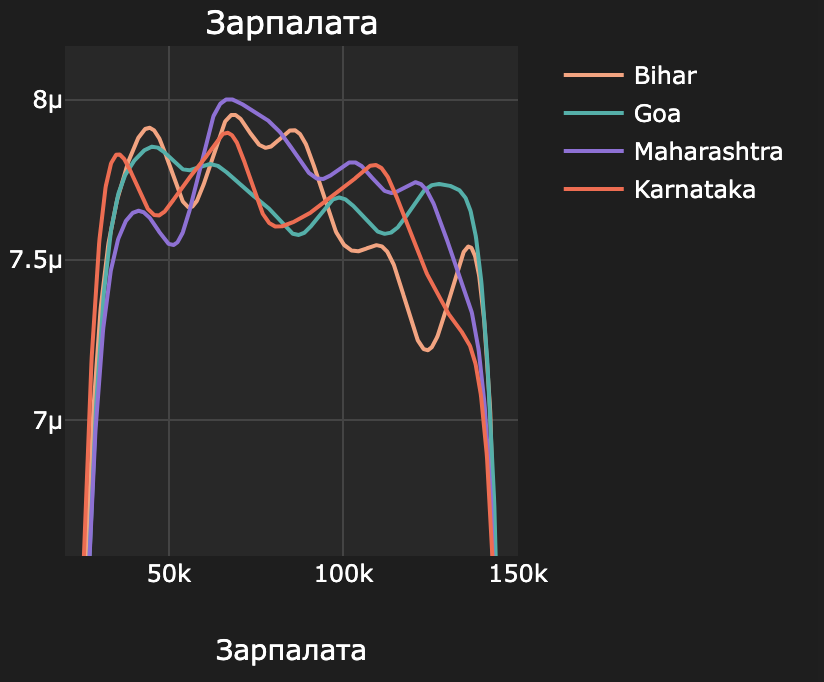

In [38]:
# Сравниваем по штатам зарплату
compare_groups_with_ci(df_v1, "Bihar", "Goa", "estimated_salary", "state")
compare_groups_with_ci(df_v1, "Bihar", "Maharashtra", "estimated_salary", "state")
compare_groups_with_ci(df_v1, "Bihar", "Karnataka", "estimated_salary", "state")
compare_groups_with_ci(df_v1, "Goa", "Maharashtra", "estimated_salary", "state")
compare_groups_with_ci(df_v1, "Goa", "Karnataka", "estimated_salary", "state")
compare_groups_with_ci(df_v1, "Maharashtra", "Karnataka", "estimated_salary", "state")


Точечная оценка разницы для Bihar и Goa: -554.2178
Доверительный интервал для разницы: (-1647.0210, 514.8634)
Среднее через бутстрэп: -543.6641

Точечная оценка разницы для Bihar и Maharashtra: -486.6483
Доверительный интервал для разницы: (-1551.8313, 624.3039)
Среднее через бутстрэп: -475.2240

Точечная оценка разницы для Bihar и Karnataka: 349.6241
Доверительный интервал для разницы: (-702.0434, 1532.6416)
Среднее через бутстрэп: 361.7164

Точечная оценка разницы для Goa и Maharashtra: 67.5695
Доверительный интервал для разницы: (-1030.3305, 1134.6476)
Среднее через бутстрэп: 61.7055

Точечная оценка разницы для Goa и Karnataka: 903.8420
Доверительный интервал для разницы: (-230.9209, 1954.8235)
Среднее через бутстрэп: 900.1960

Точечная оценка разницы для Maharashtra и Karnataka: 836.2725
Доверительный интервал для разницы: (-213.8669, 1921.7179)
Среднее через бутстрэп: 844.8609



## №4

- Delhi и Mumbai
- Delhi и Bangalore
- Mumbai и Bangalore

Также через ANOVA и тест Манна-Уитни посмотрю различается ли кол-во отправленых смс в разных городах.

In [39]:
city_3 = ["Delhi", "Mumbai", "Bangalore"]
sms_column = "sms_sent"

# ANOVA
def anova_test(df, cities, column):
    # данные по каждому городу
    groups = [df[df["city"] == city][column] for city in cities]
    
    f_stat, p_val = f_oneway(*groups)
    
    print("Результаты ANOVA:")
    print(f"F-статистика: {f_stat:.4f}, p-значение: {p_val:.4f}")
    
    if p_val < 0.05:
        print("Есть статистически значимые различия между городами.")
    else:
        print("Нет статистически значимых различий между городами.")
    
# Манна-Уитни
def mann_whitney_test(df, city1, city2, column):
    data1 = df[df["city"] == city1][column]
    data2 = df[df["city"] == city2][column]
    
    stat, p_val = mannwhitneyu(data1, data2)
    
    print(f"\nРезультаты Манна-Уитни для {city1} и {city2}:")
    print(f"Статистика: {stat:.4f}, p-значение: {p_val:.4f}")
    
    if p_val < 0.05:
        print(f"Есть статистически значимые различия между {city1} и {city2}.")
    else:
        print(f"Нет статистически значимых различий между {city1} и {city2}.")

# Выполнение функции ANOVA для всех городов
anova_test(df_v1, city_3, sms_column)

# Попарное сравнение через тест Манна-Уитни
pairs = [
    ("Delhi", "Mumbai"),
    ("Delhi", "Bangalore"),
    ("Mumbai", "Bangalore")
]

for city1, city2 in pairs:
    mann_whitney_test(df_v1, city1, city2, sms_column)

Результаты ANOVA:
F-статистика: 0.9726, p-значение: 0.3781
Нет статистически значимых различий между городами.

Результаты Манна-Уитни для Delhi и Mumbai:
Статистика: 812279739.5000, p-значение: 0.1611
Нет статистически значимых различий между Delhi и Mumbai.

Результаты Манна-Уитни для Delhi и Bangalore:
Статистика: 819621461.5000, p-значение: 0.6106
Нет статистически значимых различий между Delhi и Bangalore.

Результаты Манна-Уитни для Mumbai и Bangalore:
Статистика: 822852524.0000, p-значение: 0.3741
Нет статистически значимых различий между Mumbai и Bangalore.


# Вывод

По смс статзначимых различий между гордами не было выявлено

In [40]:
# Сравниваем по городам смс
compare_groups_with_ci(df_v1, "Delhi", "Mumbai", "sms_sent", "city")
compare_groups_with_ci(df_v1, "Delhi", "Bangalore", "sms_sent", "city")
compare_groups_with_ci(df_v1, "Mumbai", "Bangalore", "sms_sent", "city")


Точечная оценка разницы для Delhi и Mumbai: -0.1411
Доверительный интервал для разницы: (-0.3372, 0.0538)
Среднее через бутстрэп: -0.1395

Точечная оценка разницы для Delhi и Bangalore: -0.0555
Доверительный интервал для разницы: (-0.2578, 0.1436)
Среднее через бутстрэп: -0.0526

Точечная оценка разницы для Mumbai и Bangalore: 0.0856
Доверительный интервал для разницы: (-0.1231, 0.2794)
Среднее через бутстрэп: 0.0833


# Регрессионный анализ

1) Оценить модель линейной регрессии методом МНК, подготовить репорт модели и проинтерпретировать оценки коэффициентов.

2) Провести тесты на гетероскедастичность, мультиколлинеарность (как визуальные, так и численные), дать комментарии по произведенным тестам. В случае нарушения предпосылок Гаусса-Маркова – принять соответствующие корректирующие модель действия, после чего повторить пункт 1.

3) В ходе анализа протестируйте как минимум 2 спецификации моделей. Финальная спецификация модели может включать не все факторы и не все наблюдения из исходной выборки. Продемонстрируйте на примере финальной и одной из промежуточных моделей, по каким критериям и метрикам был произведен выбор в пользу финальной спецификации. Дайте трактовку значениям этих критериев и метрик.

В датасете у меня есть customer_id,telecom_partner,gender,age,state,city,pincode,date_of_registration,num_dependents,estimated_salary,calls_made,sms_sent,data_used,churn + добавила ранее registration_year

Для обучения модели выкину: customer_id, pincode, date_of_registration, потому что первые два уникальные значения, а дату я заменила на год

In [41]:
dataset = df_v1.copy()

target = 'data_used'
categorical_features = ['telecom_partner', 'state', 'city', 'gender', 'num_dependents', 'registration_year', 'churn']
numerical_features = ['estimated_salary', 'sms_sent', 'age', 'calls_made']

# заменяю категориальные через one-hot encoding
dataset = pd.get_dummies(dataset, columns=categorical_features, drop_first=True)

dummified_features = [col for col in dataset.columns if col != target]

dummified_features = [col for col in dummified_features if col not in ['customer_id', 'pincode', 'date_of_registration']]

X = sm.add_constant(dataset[dummified_features])
y = dataset[target]

# преобразую булевы признаки в 0 и 1 int
bool_columns = X.select_dtypes(include=['bool']).columns
X[bool_columns] = X[bool_columns].astype(int)

# обучаю модель линейной регрессии
model = sm.OLS(y, X).fit()

# добавляю предсказания и остатки в датасет
dataset[f'{target}_hat'] = model.fittedvalues
dataset['residuals'] = model.resid

# отчет по модели
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:              data_used   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.136
Date:                Wed, 19 Mar 2025   Prob (F-statistic):              0.241
Time:                        15:10:13   Log-Likelihood:            -2.2885e+06
No. Observations:              243553   AIC:                         4.577e+06
Df Residuals:                  243504   BIC:                         4.578e+06
Df Model:                          48                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const           

In [42]:
summary = model.summary2().tables[1]

for index, row in summary.iterrows():
    if row['P>|t|'] < 0.05:
        print(f"{index}:")
        print(f"coef    {row['Coef.']:.4f}    std err    {row['Std.Err.']:.4f}    t    {row['t']:.4f}    P>|t|    {row['P>|t|']:.4f}    [{row['[0.025']:.4f}   {row['0.975]']:.4f}]")

const:
coef    4999.2178    std err    46.8710    t    106.6591    P>|t|    0.0000    [4907.3519   5091.0836]
num_dependents_1:
coef    43.9848    std err    18.6547    t    2.3578    P>|t|    0.0184    [7.4221   80.5476]
num_dependents_3:
coef    51.2546    std err    18.6547    t    2.7475    P>|t|    0.0060    [14.6918   87.8174]
registration_year_2021:
coef    -32.0047    std err    15.2518    t    -2.0984    P>|t|    0.0359    [-61.8979   -2.1115]


# Первая итерация

* По отчету видно, что требуется существенная доработка модели. У меня R-squared = 0 и Adj. R-squared тоже равен 0. Это означает, что что модель объясняет очень малую долю дисперсии зависимой переменной (data_used). Практически ни один из включенных предикторов не вносит значимого вклада в объяснение вариации в объеме использованных данных.

* F-statistic = 0.241. Такое значение p-value выше 0.05. Это означает, что в целом модель статистически незначима. Мы не можем отвергнуть нулевую гипотезу о том, что все коэффициенты (кроме константы) равны нулю.

* P>|t| для отдельных коэффициентов тоже намного выше 0.05. Значит, индивидуальные предикторы статистически незначимы в объяснении моего таргета при $\alpha = 0.05$.

* Condition Number = 2.66e+06. Получилоась очень высокое значение, что указывает на сильную мультиколлинеарность (это я проверила и ее нет, см. ниже), значит есть какие - то другие численные проблемы в данных. 

Итак, мой вывод, что модель в первом приближении крайне плохая. Для объяснения объема использованных данных (data_used) -  не подходит. Она имеет очень низкую объясняющую способность и статистически незначима как целое. Вообще предполагаю, что данные не зависят линейно. Я сейчас только поняла, что, наверное, на кагле надо было искать датасеты с ноутбуками, где проведена линейная регрессия. Не додумалась, мне этот датасет понравился, и я подумала, что тут интересно будет предсказать траты звонков или траффика.

Поэтому я поисследую еще ниже, но уже сейчас сколняюсь к тому, что попробую другие модели машинного обучения.

Еще также сейчас рассмотрю отдельные коэффициенты, которые получила при первой итерации:

- const (4999.2178) == (intercept) == константа. Оно представляет собой ожидаемое среднее значение data_used, когда все остальные предикторы в модели равны нулю. В контексте моих признаков, многие из которых не могут быть одновременно равны нулю (например, дамми переменные), эта интерпретация может быть не очень хорошей.

- age (0.1302). Такое значение показывает, что при прочих равных условиях, увеличение возраста на один год приводит к увеличению среднего объема использованных данных на 0.1302 единицы. Однако, этот эффект статистически незначим (p=0.717).

- estimated_salary (-0.0003). Такое значение показывает, что при прочих равных условиях, увеличение предполагаемой зарплаты на одну единицу приводит к уменьшению среднего объема использованных данных на 0.0003 единицы. Этот эффект также статистически незначим (p=0.109).

- calls_made (0.1242). Такое значение показывает, что при прочих равных условиях, увеличение количества совершенных звонков на один приводит к увеличению среднего объема использованных данных на 0.1242 единицы. Этот эффект статистически незначим (p=0.541).

- sms_sent (-0.5734). Такое значение показывает, что при прочих равных условиях, увеличение количества отправленных SMS на один приводит к уменьшению среднего объема использованных данных на 0.5734 единицы. Этот эффект также статистически незначим (p=0.159).

- churn (6.1145). Такое значение показывает, что при прочих равных условиях, клиенты, которые ушли (churn=1), в среднем используют на 6.1145 единицы данных больше, чем клиенты, которые не ушли (churn=0). Однако, этот эффект статистически незначим (p=0.678).

- telecom_partner_BSNL (3.9246). Такое значение показывает, что при прочих равных условиях, абоненты оператора связи BSNL в среднем используют на 3.9246 единицы данных больше, чем абоненты базовой категории оператора связи (которая была опущена при дамми-кодировании). Этот эффект статистически незначим (p=0.814).

- telecom_partner_Reliance Jio (-24.4233). Такое значение показывает, что при прочих равных условиях, абоненты оператора связи Reliance Jio в среднем используют на 24.4233 единицы данных меньше, чем абоненты базовой категории оператора связи. Этот эффект также статистически незначим (p=0.143).

- telecom_partner_Vodafone (-7.1666). Такое значение показывает, что при прочих равных условиях, абоненты оператора связи Vodafone в среднем используют на 7.1666 единицы данных меньше, чем абоненты базовой категории оператора связи. Этот эффект также статистически незначим (p=0.668).

И аналогично можно рассмотреть для городов и штатов, мужчин и женщин, число иждевенцев и дата регистрации.

И как показано выше, статзначимые резульататы дали только:

- num_dependents_1

- num_dependents_3

- registration_year_2021


# Провести тесты на гетероскедастичность, мультиколлинеарность (как визуальные, так и численные), дать комментарии по произведенным тестам. В случае нарушения предпосылок Гаусса-Маркова – принять соответствующие корректирующие модель действия, после чего повторить пункт 1.

In [43]:
custom_template = {
    "layout": go.Layout(
        plot_bgcolor="#2B2B2B",
        paper_bgcolor="#2B2B2B",
        font=dict(color="white"),
    )
}

plot_colors = {
    "predictions": "#F5F5DC",  # Молочно-белый
    "ideal_line": "#FF6347",   # Томатный
    "constant": "#9370DB"      # Светло-фиолетовый
}

min_val = dataset[target].min()
max_val = dataset[target].max()

# Константа модели
const_value = 4999.2178  

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=dataset[target], 
    y=dataset[f'{target}_hat'], 
    mode='markers',
    marker=dict(color=plot_colors["predictions"], opacity=0.7, size=6),
    name="Предсказания"
))

fig.add_trace(go.Scatter(
    x=[min_val, max_val], 
    y=[min_val, max_val], 
    mode='lines', 
    line=dict(color=plot_colors["ideal_line"], dash='dash', width=2),
    name="Идеальное соответствие"
))

fig.add_trace(go.Scatter(
    x=[min_val, max_val], 
    y=[const_value, const_value], 
    mode='lines', 
    line=dict(color=plot_colors["constant"], dash='dot', width=2),
    name="Константа модели (4999.22)"
))

fig.update_layout(
    title="Сравнение предсказаний и реальных значений",
    title_x=0.5,
    xaxis_title="Реальные значения",
    yaxis_title="Предсказанные значения",
    template=custom_template,
    font=dict(size=12),
    margin=dict(l=60, r=40, t=50, b=40),
    width=800, height=500,
    showlegend=True
)

fig.show()

# Сохранение графика в HTML
fig.write_html('fig5.html')

# График "Сравнение предсказаний и реальных значений" 

Я решила посмотреть как предсказанные значения модели соотносятся с фактическими значениями. 

Из графика видно, что предсказанные значения почти постоянны, то есть все белые точки лежат на горизонтальной линии примерно на уровне 5000 по оси "Предсказанные значения". Это означает, что модель для всех или почти всех входных данных выдает одно и то же предсказание, близкое к 5000 (как раз наша константа).

Реальные значения сильно варьируются: По оси "Реальные значения" точки распределены по всему диапазону, от 0 до 10000. Это говорит о том, что фактические значения целевой переменной сильно различаются для разных наблюдений.

А диагональная красная пунктирная линия представляет идеальные предсказания, где предсказанное значение точно равно реальному. Отчетливо видно, что белые точки очень далеки от этой линии и не демонстрируют никакой тенденции следовать ей. 

Следовательно, модель очень плохо предсказывает. Она не улавливает зависимость между входными признаками и таргетом. Просто выдает всегда константное значение.

# Графики остатков

И мне также интересно посмотреть на остатки. Как они распределены?

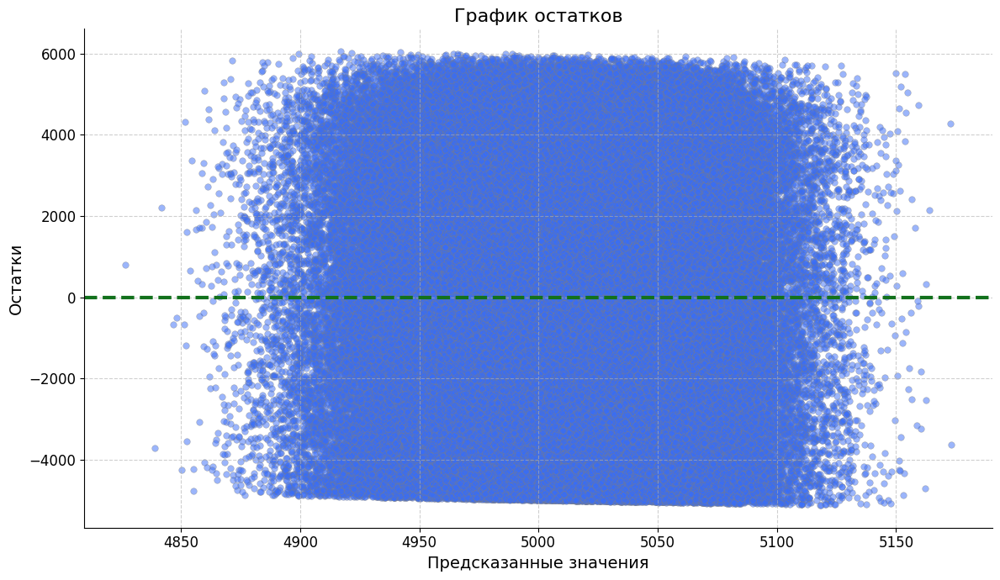

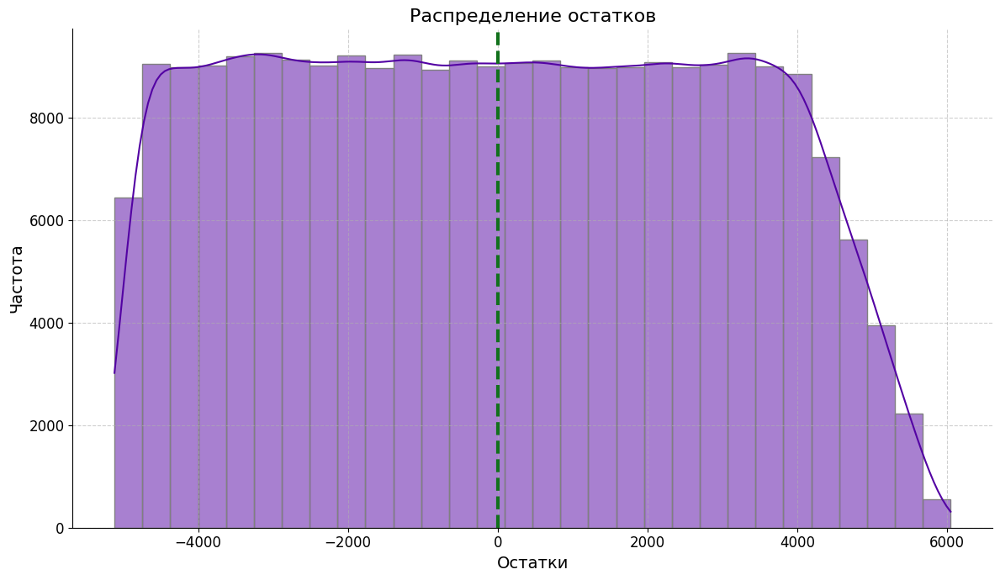

In [44]:
# График остатков (Residuals vs. Fitted)
plt.figure(figsize=(12, 7))
sns.set_palette("rainbow")
sns.scatterplot(x=dataset[f'{target}_hat'], y=dataset['residuals'], alpha=0.5, s=30, edgecolor='gray')
plt.axhline(y=0, color=sns.color_palette("dark")[2], linestyle='--', linewidth=3)
plt.xlabel("Предсказанные значения", fontsize=14)
plt.ylabel("Остатки", fontsize=14)
plt.title("График остатков", fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
sns.despine()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# Гистограмма остатков
plt.figure(figsize=(12, 7))
sns.set_palette("plasma")
sns.histplot(dataset['residuals'], kde=True, bins=30, edgecolor='gray')
plt.axvline(x=0, color=sns.color_palette("dark")[2], linestyle='--', linewidth=3)
plt.xlabel("Остатки", fontsize=14)
plt.ylabel("Частота", fontsize=14)
plt.title("Распределение остатков", fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
sns.despine()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


Первый график показывает зависимость между предсказанными значениями (fitted values) и остатками (residuals), которые представляют собой разницу между фактическими значениями целевой переменной и значениями, предсказанными моделью.

Из него видно, что точки на графике распределены в виде относительно равномерной горизонтальной полосы вокруг горизонтальной зеленой пунктирной линии, которая соответствует нулевому остатку. Модель, вероятно, правильно уловила линейную связь между предикторами и целевой переменной. Если бы связь была нелинейной, мы могли бы увидеть кривую в распределении остатков. И также наблюдается **гомоскедастичность** (постоянство дисперсии ошибок). Равномерная ширина полосы остатков по всему диапазону предсказанных значений свидетельствует о том, что дисперсия ошибок (разброс остатков) примерно одинакова для всех уровней предсказанных значений. Если бы дисперсия была непостоянной (например, остатки сильнее разбрасывались при больших предсказанных значениях), это указывало бы на гетероскедастичность.

А вот второй график - гистограмма распределения остатков модели линейной регрессии, не такой радужный. Он показывает, как часто встречаются остатки различных величин. В идеале они должны быть нормально распределены, тогда модель делает адекватные предположения. У меня же оценка плотности ядра показывает некоторую "плосковершинность" и более "тяжелые" хвосты, чем у идеального нормального распределения. 

# Покажу отклонение от нормальности на QQ-plot остатков

<Figure size 1200x700 with 0 Axes>

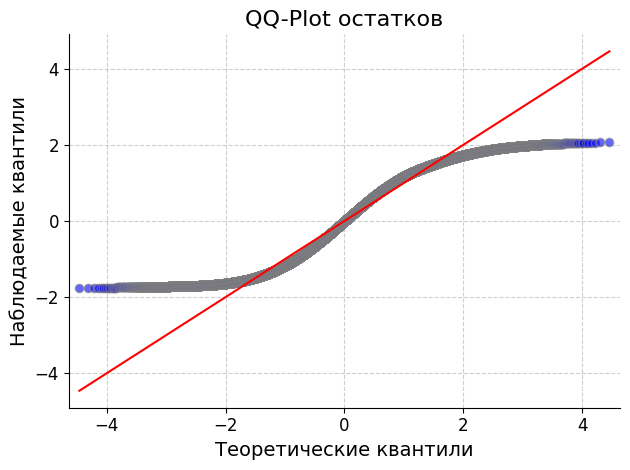

In [45]:
plt.figure(figsize=(12, 7))
sns.set_palette("rainbow")

sm.qqplot(dataset['residuals'], line='s', fit=True, alpha=0.6, markerfacecolor='blue', markeredgecolor='gray')

plt.xlabel("Теоретические квантили", fontsize=14)
plt.ylabel("Наблюдаемые квантили", fontsize=14)
plt.title("QQ-Plot остатков", fontsize=16)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

sns.despine()
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


# Еще интересно посмотреть на Heat map

Для этого из исходного датасета возьму все численные признаки

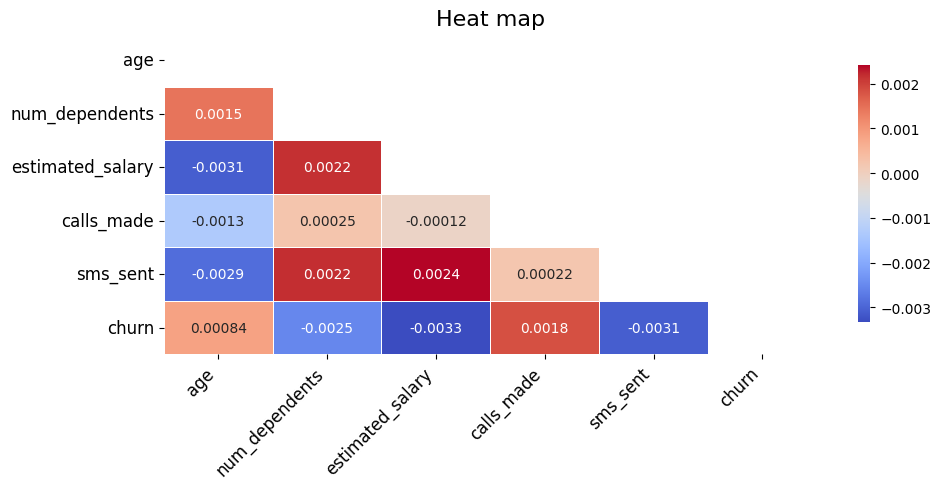

In [46]:
dataset_heatmap = df_v1.copy()
drop_column_list=['customer_id','pincode','date_of_registration','data_used']
dataset_heatmap.drop(drop_column_list,axis=1,inplace=True)

numeric_df = dataset_heatmap.select_dtypes(include=['int64'])

correlation_matrix = numeric_df.corr()
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

plt.figure(figsize=(10, 5))

sns.heatmap(correlation_matrix,
            annot=True,
            cmap='coolwarm',
            mask=mask,
            linewidths=.5,
            cbar_kws={"shrink": .8},
            )

plt.title("Heat map", fontsize=16)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(rotation=0, fontsize=12)
plt.tight_layout()
plt.show()

Из heatmap можно сделать вывод, что признаки в , по-видимому, не имеют сильной линейной зависимости друг от друга. Но они могут зависить друг от друга нелинейно. Отрицательная корреляция между estimated_salary и churn может указывать на то, что клиенты с более высокой предполагаемой зарплатой немного менее склонны к оттоку. Но, эта связь очень слабая.

# Теперь посмотрю с помощью тестов

# Гетероскедастичность: тест Бреуша-Пагана

Проверю, изменяется ли дисперсия ошибок по мере изменения предсказанных значений.

In [47]:
from statsmodels.stats.diagnostic import het_breuschpagan

# Тест на гетероскедастичность
bp_test = het_breuschpagan(dataset['residuals'], X)
bp_test_result = pd.DataFrame(bp_test, index=["LM statistic", "LM p-value", "F-statistic", "F p-value"]).T
print("Результаты теста Бреуша-Пагана:")
print(bp_test_result)


Результаты теста Бреуша-Пагана:
   LM statistic  LM p-value  F-statistic  F p-value
0     42.798765    0.685308     0.891618   0.685339


p-value для LM / F-статистики больше уровня значимости (0.05), значит, гетероскедастичности нет.

# Мультиколлиниарность

Для проверки мультиколлинеарности буду использовать коэффициент инфляции дисперсии (VIF). Если VIF для какого-то признака значительно больше 10, это указывает на проблему мультиколлинеарности.

In [48]:
def calc_VIF(dataset, feature_names, output_file='vif_results.txt'):
    dataset[feature_names] = dataset[feature_names].apply(lambda x: x.astype(int) if x.dtype == 'bool' else x)

    # к числовому типу
    dataset_clean = dataset[feature_names].apply(pd.to_numeric, errors='coerce')
    
    # Добавляем константу в признаки для расчета VIF
    X = sm.add_constant(dataset_clean[feature_names])
    
    # VIF для каждого признака
    VIFs = pd.Series(
        [variance_inflation_factor(X.values, i) for i in range(X.shape[1])],
        index=X.columns)
    
    # датафрейм для VIF значений
    dt = pd.DataFrame(VIFs).reset_index()
    dt.columns = ['Feature', 'VIF']
    
    # запишу в файл, потому что у меня очень много признаков, они не помещаются в принт
    with open(output_file, 'w') as file:
        file.write("Результаты VIF:\n")
        file.write(dt.to_string(index=False))
        
        file.write("\n\nИнтерпретация результатов VIF:\n")
        
        for _, row in dt.iterrows():
            if row['VIF'] >= 10:
                file.write(f"Признак '{row['Feature']}' имеет высокий VIF: {row['VIF']}. Это может указывать на мультиколлинеарность.\n")
            elif row['VIF'] >= 5:
                file.write(f"Признак '{row['Feature']}' имеет умеренно высокий VIF: {row['VIF']}.\n")
            else:
                file.write(f"Признак '{row['Feature']}' ОК VIF: {row['VIF']}.\n")
    
    print(f"Все сохранилось нормально в '{output_file}'.")


calc_VIF(dataset, dummified_features)

Все сохранилось нормально в 'vif_results.txt'.


# Вывод

Думаю, тут очевидно, что у меня нелинейная взаимосвязь между регрессандом и регрессорами. Поэтому МНК показывает, что почти все независимые переменные не являются значимыми.

Я сначала думала применить логарифм, но на графике ниже (pair плоте), показано, что и это не является решением проблемы. Поскольку в условии задания разрешено "применить творчество" и я вот так неудачно выбрала датасет (ну ничего, мы же учимся, зато я во всем разобралась), то я попробую другие модели, а еще попробую модели классификации, потому что есть колонка "churn", которая так и просится, чтобы ее предсказали.

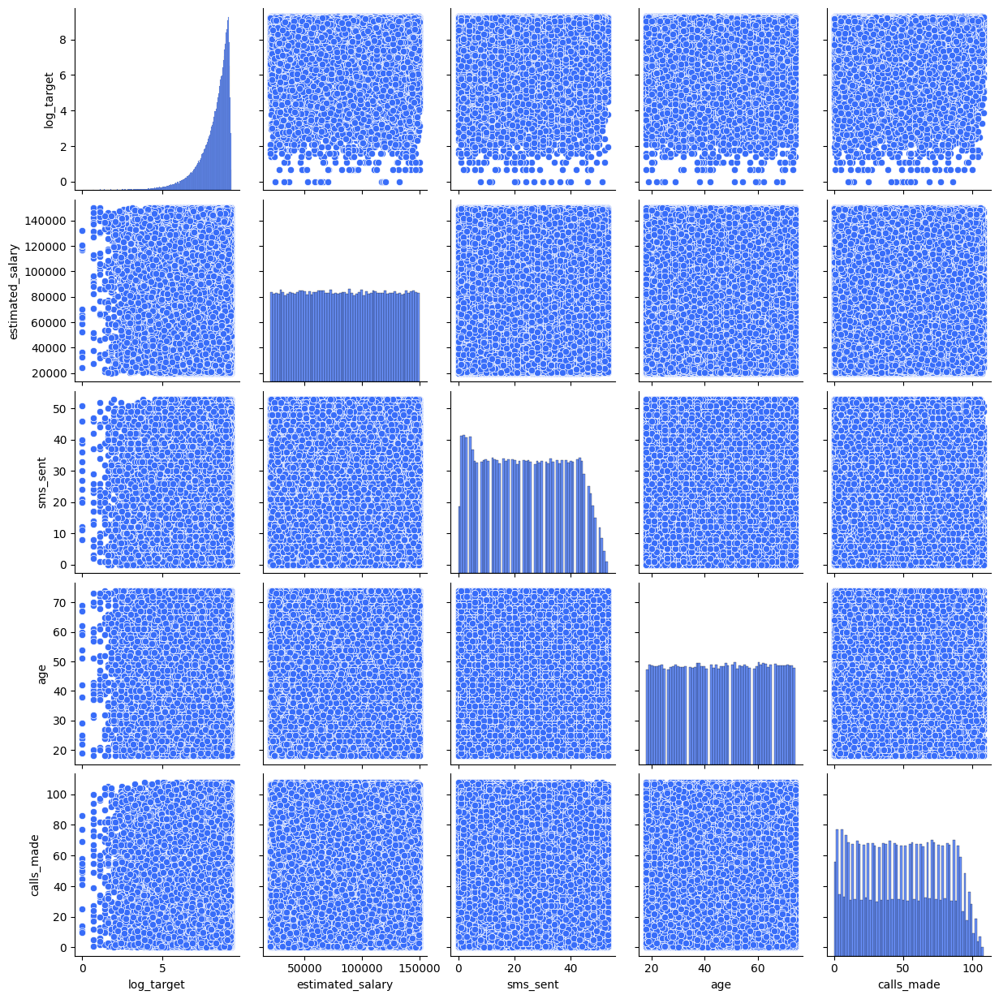

In [49]:
dataset['log_target'] = np.log1p(dataset['data_used']) 

sns.pairplot(dataset[['log_target', 'estimated_salary', 'sms_sent', 'age', 'calls_made']])
plt.show()

# попробую применить нелинейные модели для предсказания непрервыной переменной: полиномиальную регрессию

Признаки сгенерирую до второй степени (квадраты и попарные произведения).

In [50]:
X = dataset[dummified_features]
y = dataset[target]

bool_columns = X.select_dtypes(include=['bool']).columns
X[bool_columns] = X[bool_columns].astype(int)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# обучение модели полиномиальной регрессии
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

model_poly = LinearRegression()
model_poly.fit(X_train_poly, y_train)

y_test_pred = model_poly.predict(X_test_poly)

# оценка качества модели
mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)

print(f"MSE на тестовой выборке: {mse_test}")
print(f"R² на тестовой выборке: {r2_test}")
print(f"MAE на тестовой выборке: {mae_test}")

MSE на тестовой выборке: 8515023.2830765
R² на тестовой выборке: -0.0009790206150102065
MAE на тестовой выборке: 2520.229503954955


К сожалению, метрики указывают на то, что модель полиномиальной регрессии не смогла адекватно смоделировать зависимость между признаками и целевой переменной data_used.

- MSE измеряет средний квадрат разницы между прогнозируемыми и фактическими значениями. Чем выше MSE, тем больше ошибки модели. У меня MSE очень велико, что говорит о том, что модель делает большие ошибки в прогнозах.

- Отрицательное $R^2$ означает, что модель работает хуже, чем просто среднее.

- MAE измеряет среднюю абсолютную разницу между прогнозируемыми и фактическими значениями. Это значение показывает, насколько в среднем ошибается модель в единицах целевой переменной. В моем случае в среднем прогнозы модели отклоняются от фактических значений на 2520 единиц. Это очень много (у меня дата измеряется в тысячах)

Попробую предсказывать кол - во звонков. И уберу из рассмотрения: все категориальные признаки, а также  'estimated_salary'

In [51]:
dataset = df_v1.copy()

target = 'calls_made'
numerical_features = ['sms_sent', 'age', 'data_used']

dummified_features = [col for col in dataset.columns if col != target]

dummified_features = [col for col in dummified_features if col not in ['customer_id', 'pincode', 'date_of_registration', 'state', 'city', 'gender', 'estimated_salary','telecom_partner', 'churn', 'num_dependents', 'registration_year']]

X = dataset[dummified_features]
y = dataset[target]

bool_columns = X.select_dtypes(include=['bool']).columns
X[bool_columns] = X[bool_columns].astype(int)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

model_poly = LinearRegression()
model_poly.fit(X_train_poly, y_train)

y_test_pred = model_poly.predict(X_test_poly)

mse_test = mean_squared_error(y_test, y_test_pred)
r2_test = r2_score(y_test, y_test_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)

print(f"MSE на тестовой выборке: {mse_test}")
print(f"R² на тестовой выборке: {r2_test}")
print(f"MAE на тестовой выборке: {mae_test}")

MSE на тестовой выборке: 848.9984517611172
R² на тестовой выборке: -0.00018598877575248807
MAE на тестовой выборке: 25.196428345713823


Ну, относительно предыдущего раза параметры стали по - лучше, но все же они указывают (особенно $R^2$), что модель плохо описывает данные. Возможно, правда нет связи между выбранными х и y. Поэтому в завершение работы сделаю классификацию, для чего и предназначался этот датасет

# Ситуация...

Представлю, что в моем датасете на самом деле не хватает данных и я уточнила об этом у продукт менеджера. Он мне подсказал, что я могу взять также три дополнительных стобца, которые косвенно связаны с регрессандом: data_used

Я буду формировать их по принципу:

- feature_1 = a * data_used + noise1
- feature_2 = b * data_used + noise2
- feature_3 = c * data_used + noise3

In [52]:
df_v2 = df_v1.copy()

target = df_v2['data_used']

# нагенерирую новые признаки с линейной зависимостью
np.random.seed(42)
df_v2["feature_1"] = 0.5 * df_v2["data_used"] + np.random.normal(0, 1000, len(df_v2))
df_v2["feature_2"] = 1.2 * df_v2["data_used"] + np.random.normal(0, 20000, len(df_v2))
df_v2["feature_3"] = -0.3 * df_v2["data_used"] + np.random.normal(0, 500, len(df_v2))

X = sm.add_constant(df_v2[['feature_1', 'feature_2', 'feature_3']])
y = df_v2['data_used']

model = sm.OLS(y, X).fit()

df_v2['data_used_hat'] = model.fittedvalues
df_v2['residuals'] = model.resid


print(model.summary())


                            OLS Regression Results                            
Dep. Variable:              data_used   R-squared:                       0.839
Model:                            OLS   Adj. R-squared:                  0.839
Method:                 Least Squares   F-statistic:                 4.217e+05
Date:                Wed, 19 Mar 2025   Prob (F-statistic):               0.00
Time:                        15:12:49   Log-Likelihood:            -2.0664e+06
No. Observations:              243553   AIC:                         4.133e+06
Df Residuals:                  243549   BIC:                         4.133e+06
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        808.9000      4.425    182.818      0.0

Теперь у меня $R^2$ свидетельствует о том, что модель линейной регрессии вполне адекватно описывает имеющеиеся данные. С помощью шума я могу искуственно изменять $R^2$

А все 3 фичи показывают статзначимый результат

# Проведу кратенько тесты на гетероскедастичность и мультиколлиниарность

потому что у меня уже ipynb умирает от кол-ва ячеек

In [53]:
from statsmodels.stats.diagnostic import het_breuschpagan

# Тест на гетероскедастичность
bp_test = het_breuschpagan(df_v2['residuals'], X)
bp_test_result = pd.DataFrame(bp_test, index=["LM statistic", "LM p-value", "F-statistic", "F p-value"]).T
print("Результаты теста Бреуша-Пагана:")
print(bp_test_result)


Результаты теста Бреуша-Пагана:
   LM statistic  LM p-value  F-statistic  F p-value
0      4.669194    0.197686     1.556402   0.197688


In [54]:
calc_VIF(df_v2, ['feature_1', 'feature_2', 'feature_3'])

Все сохранилось нормально в 'vif_results.txt'.


Тесты показали, что отсутствует гетероскедастичность и мультиколлиниарность. Графики я рисовать не стала, потому что ноутбук падает от кол-ва ячеек

# Десерт: кластеризация

Сначала мне вообще интересно посмотреть соотношение 0 и 1 (ушел/не ушел) в моей категориальной переменной, которую буду предсказывать. Вижу явный дисбаланс классов, что говорит о том, что "не ушедших клиентов" примерно в 4 раза больше, чем "ушедших". Буду решать проблему

In [55]:
dataset_clact = df_v1.copy()

dataset_clact['churn'].value_counts()

churn
0    194726
1     48827
Name: count, dtype: int64

In [56]:
dataset_clact

,customer_id,telecom_partner,gender,age,state,city,pincode,date_of_registration,num_dependents,estimated_salary,calls_made,sms_sent,data_used,churn,registration_year
0,1,Reliance Jio,F,25,Karnataka,Kolkata,755597,2020-01-01,4,124962,44,45,361,0,2020
1,2,Reliance Jio,F,55,Mizoram,Mumbai,125926,2020-01-01,2,130556,62,39,5973,0,2020
2,3,Vodafone,F,57,Arunachal Pradesh,Delhi,423976,2020-01-01,0,148828,49,24,193,1,2020
3,4,BSNL,M,46,Tamil Nadu,Kolkata,522841,2020-01-01,1,38722,80,25,9377,1,2020
4,5,BSNL,F,26,Tripura,Delhi,740247,2020-01-01,2,55098,78,15,1393,0,2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
243548,243549,Airtel,F,28,Mizoram,Kolkata,110295,2023-05-03,3,130580,28,9,4102,0,2023
243549,243550,Reliance Jio,F,52,Assam,Kolkata,713481,2023-05-03,0,82393,80,45,7521,0,2023
243550,243551,Reliance Jio,M,59,Tripura,Kolkata,520218,2023-05-03,4,51298,26,4,6547,0,2023
243551,243552,BSNL,M,49,Madhya Pradesh,Kolkata,387744,2023-05-03,2,83981,80,15,1125,0,2023


In [57]:
dataset_clact = dataset_clact.drop(columns=['customer_id', 'pincode', 'date_of_registration'])
dataset_clact

,telecom_partner,gender,age,state,city,num_dependents,estimated_salary,calls_made,sms_sent,data_used,churn,registration_year
0,Reliance Jio,F,25,Karnataka,Kolkata,4,124962,44,45,361,0,2020
1,Reliance Jio,F,55,Mizoram,Mumbai,2,130556,62,39,5973,0,2020
2,Vodafone,F,57,Arunachal Pradesh,Delhi,0,148828,49,24,193,1,2020
3,BSNL,M,46,Tamil Nadu,Kolkata,1,38722,80,25,9377,1,2020
4,BSNL,F,26,Tripura,Delhi,2,55098,78,15,1393,0,2020
...,...,...,...,...,...,...,...,...,...,...,...,...
243548,Airtel,F,28,Mizoram,Kolkata,3,130580,28,9,4102,0,2023
243549,Reliance Jio,F,52,Assam,Kolkata,0,82393,80,45,7521,0,2023
243550,Reliance Jio,M,59,Tripura,Kolkata,4,51298,26,4,6547,0,2023
243551,BSNL,M,49,Madhya Pradesh,Kolkata,2,83981,80,15,1125,0,2023


In [58]:
encode = LabelEncoder()
categorical_columns = ['telecom_partner', 'gender', 'state', 'city', 'num_dependents', 'registration_year']
for col in categorical_columns:
    dataset_clact[col] = encode.fit_transform(dataset_clact[col])

X = dataset_clact.drop(columns=['churn'])  # Признаки
y = dataset_clact['churn']  # Целевая переменная

# Масштабирование данных
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Разделение на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Применение SMOTE для устранения дисбаланса классов
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

models = {
    'Random Forest': RandomForestClassifier(),
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'KNN': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
}

results = {}
for model_name, model in models.items():
    model.fit(X_train_resampled, y_train_resampled)
    
    y_pred = model.predict(X_test)
    
    accuracy = accuracy_score(y_test, y_pred)
    results[model_name] = accuracy

print("Точность моделей:")
for model_name, accuracy in results.items():
    print(f"{model_name}: {accuracy:.4f}")


Точность моделей:
Random Forest: 0.7956
Logistic Regression: 0.5100
KNN: 0.5447
Decision Tree: 0.6612


In [59]:
dataset_clact = df_v1.copy()
dataset_clact = dataset_clact.drop(columns=['customer_id', 'pincode', 'date_of_registration'])

In [60]:
dataset_clact

,telecom_partner,gender,age,state,city,num_dependents,estimated_salary,calls_made,sms_sent,data_used,churn,registration_year
0,Reliance Jio,F,25,Karnataka,Kolkata,4,124962,44,45,361,0,2020
1,Reliance Jio,F,55,Mizoram,Mumbai,2,130556,62,39,5973,0,2020
2,Vodafone,F,57,Arunachal Pradesh,Delhi,0,148828,49,24,193,1,2020
3,BSNL,M,46,Tamil Nadu,Kolkata,1,38722,80,25,9377,1,2020
4,BSNL,F,26,Tripura,Delhi,2,55098,78,15,1393,0,2020
...,...,...,...,...,...,...,...,...,...,...,...,...
243548,Airtel,F,28,Mizoram,Kolkata,3,130580,28,9,4102,0,2023
243549,Reliance Jio,F,52,Assam,Kolkata,0,82393,80,45,7521,0,2023
243550,Reliance Jio,M,59,Tripura,Kolkata,4,51298,26,4,6547,0,2023
243551,BSNL,M,49,Madhya Pradesh,Kolkata,2,83981,80,15,1125,0,2023


In [61]:
# One-Hot Encoding (OHE) вместо LabelEncoder
categorical_columns = ['telecom_partner', 'gender', 'state', 'city', 'num_dependents', 'registration_year']
dataset_clact = pd.get_dummies(dataset_clact, columns=categorical_columns, drop_first=True)

X = dataset_clact.drop(columns=['churn'])  # Признаки
y = dataset_clact['churn']  # Целевая переменная

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

models = {
    'Random Forest': RandomForestClassifier(),
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'KNN': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
}

results = {}
for model_name, model in models.items():
    model.fit(X_train_resampled, y_train_resampled)
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    results[model_name] = accuracy

print("Точность моделей:")
for model_name, accuracy in results.items():
    print(f"{model_name}: {accuracy:.4f}")

Точность моделей:
Random Forest: 0.7810
Logistic Regression: 0.5233
KNN: 0.5332
Decision Tree: 0.6682


# Вывод

В результате видим, что данный датасет больше подходит для задач классификации. В то время как линейной или полиномиальной зависимости между признаками "удачно" установить не удалось. Из рассмотренных моделей для регрессии полиномиальная показала себя относительно лучше, но все же данные с помощью этой модели адекватно описать нельзя.

Из моделей классификации ('Random Forest', 'Logistic Regression', 'KNN', 'Decision Tree') наиболее удачно справилась Random Forest с точностью = 0.7956

Думаю, это можно объяснить тем, что Random Forest является мощным ансамблевым методом, который использует несколько решающих деревьев для улучшения точности предсказаний. Он эффективно работает с большим количеством признаков и может справляться с нелинейными зависимостями, что объясняет его более высокую точность по сравнению с другими моделями классификации. Другие модели, такие как логистическая регрессия, KNN и решающее дерево, не показали таких хороших результатов, возможно, из-за их ограничений в работе с сложными данными

Я сделала кодирование категориальных переменнных  LabelEncoder, чтобы попробовать в работе оба типа кодирования. Также тут можно сделать и через OHE. И результаты получились примерно одинаковые. Какие - то модели показали резульат лучше на пару тысячных (Decision Tree, Logistic Regression), а Random Forest и KNN, наоборот - хуже.

# 📌 Общий вывод

В ходе исследования я проанализировала датасет пользователей индийских телеком-операторов: Reliance Jio, Vodafone, BSNL и Airtel. В рамках работы были выдвинуты четыре продуктовые гипотезы, одна из которых была отвергнута на уровне статистической значимости 0.05.

Для прогнозирования количества использованных данных и звонков я применила модели линейной и полиномиальной регрессии. Однако на основе имеющихся данных выяснилось, что обе модели показывают крайне плохую предсказательную способность. В связи с этим, я дополнительно уточнила данные у PM, искусственно сгенерировав линейную зависимость между целевой переменной и тремя признаками.

Так как данные хорошо подходили для классификационных моделей, я рассмотрела Random Forest, Logistic Regression, SVM, KNN, Decision Tree и Naive Bayes. В результате сравнения определила наилучшую модель для данной задачи.